#### Importing Libraries

In [271]:
import warnings
warnings.filterwarnings("ignore")
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from sklearn.metrics import confusion_matrix
import math
import joblib
from sklearn.metrics import mean_squared_error, mean_pinball_loss, r2_score, classification_report, confusion_matrix, mean_absolute_percentage_error
from imblearn.over_sampling import SMOTENC
import lightgbm as lgb


#### Constants

In [305]:
PATH_TO_CVS = 'output/output-energy/'
# This constant contains the unique quantile to represent in the scatter plot of residuals 
ONLY_QUANTILE = 0.95
# A selection of node metrics to represent in the boxplot and in the scatter plot 
COL_TO_PLOT = ['cpu_usage_idle_node', 'cpu_usage_node', 'ram_usage_idle_node', 'ram_usage_node', 'power_usage_idle_node', 'power_usage_node']
# List containing the values whose quantile regression is to be calculated
QUANTILES = [0.05, 0.95]
NODE_TYPES = ["LIGHT", "MID", "HEAVY"]
#
SEED = 4850
NUM_TRAINING_EXPERIMENTS = 5

#### Utilities functions

In [273]:
# Function used to fill NaN values within the dataframe X
def fill_NaN(X):
  for col in X:
    if(col.startswith('success_rate_')):
      X.loc[:, col] = X.loc[:, col].fillna(1)
    else:
      X.loc[:, col] = X.loc[:, col].fillna(0)
  return X

In [274]:
# Function to reweight of dataframe
def resample_dataset(X, y):
  X_resampled, y_resampled = resample(X, y, replace=True, random_state=42)
  return X_resampled, y_resampled

In [275]:
# Function used to split the dataset into training and test set
def split_dataset(X, y):
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
  print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
  return X_train, X_test, y_train, y_test

In [276]:
def convert_dataset(X_train, X_test, y_train, y_test):
  X_train_nn = X_train.astype(np.float32)
  X_test_nn = X_test.astype(np.float32)
  y_train_nn = y_train.astype(np.float32)
  y_test_nn = y_test.astype(np.float32)
  
  return X_train_nn, X_test_nn, y_train_nn, y_test_nn

In [277]:
# Function used to calculate the weighted mean squared error
def wmse_score(y_true, y_pred):
  # Calculates the weight of classes for the first target  
  median_cpu = y_true['cpu_usage_node'].median()
  w_majority_cpu = y_true[y_true['cpu_usage_node'] <= median_cpu].shape[0] / y_true.shape[0]
  w_minority_cpu = y_true[y_true['cpu_usage_node'] > median_cpu].shape[0] / y_true.shape[0]

  # Calculate the weight of classes for the second target
  median_ram = y_true['ram_usage_node'].median()
  w_majority_ram = y_true[y_true['ram_usage_node'] <= median_ram].shape[0] / y_true.shape[0]
  w_minority_ram = y_true[y_true['ram_usage_node'] > median_ram].shape[0] / y_true.shape[0]

  # Calculates the MSE for both targets
  mse_cpu = mean_squared_error(y_true['cpu_usage_node'], y_pred['cpu_usage_node'])
  mse_ram = mean_squared_error(y_true['ram_usage_node'], y_pred['ram_usage_node'])

  # Calculates WMSE as a weighted average of the MSEs for the two targets
  wmse = (w_majority_cpu * mse_cpu * y_true.shape[0] / (w_majority_cpu * y_true[y_true['cpu_usage_node'] <= median_cpu].shape[0] + w_minority_cpu * y_true[y_true['cpu_usage_node'] > median_cpu].shape[0]) +
          w_majority_ram * mse_ram * y_true.shape[0] / (w_majority_ram * y_true[y_true['ram_usage_node'] <= median_ram].shape[0] + w_minority_ram * y_true[y_true['ram_usage_node'] > median_ram].shape[0])) / 2

  return wmse

In [278]:
# Function used to calculate metrics based on the task
def metrics(task_type, y_test, y_pred, quantile):
  if(task_type == 'regression'):
    mape = mean_absolute_percentage_error(y_test, y_pred)
    print("mape:", mape)
    mse = mean_squared_error(y_test, y_pred)
    print("mse:", mse)
    rmse = math.sqrt(mse)
    print("rmse:", rmse)
    r2 = r2_score(y_test, y_pred)
    print("R-squared score:", r2)
    std_dev = float(np.std(y_pred))
    print("Standard deviation:", std_dev)
    if quantile != 0:
      quantile_loss = mean_pinball_loss(y_test, y_pred, alpha=quantile)
      print("Quantile loss with library: ", quantile_loss)
    else:
      quantile_loss = "Not calculated for this target"
    return {"mape": mape, "mse": mse, "rmse": rmse, "r2": r2, "quantile_loss": quantile_loss, "std_dev": std_dev}    
  elif(task_type.endswith('classification')):
    report = classification_report(y_test, y_pred)
    print("Classification Report:\n", report)
    return {}

In [279]:
# Function used to plot the regression lines for the 2 targets
def plot_regression(y_test, y_pred, target_name, plot_folder = None):
    # Calculate the regression lines
    m, q = np.polyfit(y_test.ravel(), y_pred.ravel(), 1)

    # Plot the regression lines
    plt.plot(y_test, y_pred, 'o', color='red', fillstyle='none')
    plt.plot(y_test, m*y_test + q, linestyle='--')
    plt.xlabel('Observed values', fontsize = 14)
    plt.ylabel('Predicted values', fontsize = 14)
    plt.title('Regression of ' + target_name)
    plt.xlim(0, 1)  
    plt.ylim(0, 1)  
    plt.legend(fontsize = 14)
    if plot_folder is not None:
        plt.savefig(os.path.join(plot_folder, f"{target_name}.png"), dpi = 300, format = "png", bbox_inches = "tight")
        plt.close()
    else:
        plt.show()

    # Calculate residuals 
    residuals = y_test.flatten() - y_pred.flatten()

    # Scatter plot with regression line
    sns.scatterplot(x=y_test.flatten(), y=residuals, label=f'Observations')

    # Add the horizontal line near the value 0.0 of the y-axis
    plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
    plt.xlabel('Observed values', fontsize = 14)
    plt.ylabel('Residuals (Observed - Predicted values)')
    plt.title(f'Standard Regression - {target_name}')
    plt.legend(fontsize = 14)
    if plot_folder is not None:
        plt.savefig(os.path.join(plot_folder, f"{target_name}_residuals.png"), dpi = 300, format = "png", bbox_inches = "tight")
        plt.close()
    else:
        plt.show()

In [280]:
# Function used to plots quantile regression results.
def plot_quantile_regression(y_test, y_pred, target_name, plot_folder = None):
    point = 1
    line = 3
    for col in y_pred:
        m, q = np.polyfit(y_test.ravel(), y_pred[col], 1)
        plt.plot(y_test, y_pred[col], 'o', fillstyle='none', label=f'Observations - {col}')
        plt.plot(y_test, m*y_test + q, linestyle='--', zorder = line)
        point = point + 1
        line = line + 1
    plt.xlabel('Observed values', fontsize = 14)
    plt.ylabel('Predicted values', fontsize = 14)
    plt.title('Quantile Regression of ' + target_name)
    plt.xlim(0, 1)  
    plt.ylim(0, 1)  
    plt.legend(fontsize = 14)
    if plot_folder is not None:
        plt.savefig(os.path.join(plot_folder, f"{target_name}_quantile.png"), dpi = 300, format = "png", bbox_inches = "tight")
        plt.close()
    else:
        plt.show()

    # Calculate quantile residuals
    residuals = y_test.flatten() - y_pred[str(ONLY_QUANTILE)]

    # Scatter plot with regression line
    sns.scatterplot(x=y_test.flatten(), y=residuals, label=f'Observations')

    # Add the horizontal line near the value 0.0 of the y-axis
    plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
    plt.xlabel('Observed values', fontsize = 14)
    plt.ylabel('Quantile residuals (Observed - Predicted values)')
    plt.title(f'Quantile Regression {ONLY_QUANTILE} - {target_name}')
    plt.legend(fontsize = 14)
    if plot_folder is not None:
        plt.savefig(os.path.join(plot_folder, f"{target_name}_quantile_residuals.png"), dpi = 300, format = "png", bbox_inches = "tight")
        plt.close()
    else:
        plt.show()

In [281]:
# Function used to plot the confusion matrix
def plot_confusion_matrix(y_test, y_pred, target):
  # Calculate the confusion matrix
  cm = confusion_matrix(y_test[target], y_pred[target])

  # Plot the confusion matrix as heatmap
  sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
  plt.xlabel('Valori osservati')
  plt.ylabel('Valori predetti')
  plt.title('Confusion matrix')
  plt.show()

In [282]:
# Function used to train the desired model for a target variable
def train_model(target_name, X_train, y_train, quantile):
    # Classification task. Create model with autogluon
    if target_name.startswith('overloaded') or target_name.startswith('replica'):
        model_type = ""
        model = lgb.LGBMClassifier()
    # Quantile regression with LGBM
    elif quantile != 0:
        model = lgb.LGBMRegressor(objective='quantile', alpha=quantile)
        model_type = "quantile" + str(quantile).replace('.', '')
    # Regression with LGBM
    else:
        model = lgb.LGBMRegressor(objective='regression')
        model_type = "regression"
    
    model.fit(X_train, y_train)
    path = './system-forecaster-models/functions/' + target_name + "/" + model_type
    if not os.path.exists(path):
        os.makedirs(path)
    joblib.dump(model, path + "/model.joblib")
    return model



In [283]:
# Function to obtain a barchart of the type of nodes
def plot_node_type_distribution(df):
    """
    Visualizza il numero di dati per ogni tipologia di nodo in un DataFrame tramite un bar chart.

    :param df: DataFrame contenente la colonna 'node_type' con le tipologie di nodo.
    """
    # Count of occurrences for each node type
    node_counts = df['node_type'].value_counts()

    # Bar chart
    plt.figure(figsize=(10, 6))
    node_counts.plot(kind='bar')
    plt.title('Distribuzione del Numero di Dati per Tipologia di Nodo')
    plt.xlabel('Tipologia di Nodo (0 = Heavy, 1 = Mid, 2 = Light)')
    plt.ylabel('Numero di Righe')
    plt.xticks(rotation=0)  # Maintains names of horizontal node types
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.show()

In [284]:
# Function to obtain a barchart of overloaded node distribution
def plot_overloaded_node_distribution(df):
    """
    Visualizza il numero di righe in cui 'overloaded_node' è 1 e quelle in cui è 0.

    :param df: DataFrame contenente la colonna 'overloaded_node'.
    """
    # Count of occurrences of 0 and 1 in the 'overloaded_node' column
    overloaded_counts = df['overloaded_node'].value_counts()

    # Bar chart
    plt.figure(figsize=(8, 5))
    overloaded_counts.plot(kind='bar')
    plt.title('Distribuzione di Nodi Sovraccaricati')
    plt.xlabel('Stato Sovraccarico (0 = No, 1 = Sì)')
    plt.ylabel('Numero di Righe')
    plt.xticks(rotation=0)  
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.show()

In [285]:
# Function to split train/test sets
def build_train_test_data(targets, target_datasets, features_datasets):
    # Initialize dictionaries to store scaled data and train-test splits
    x_train_dict = {}
    x_test_dict = {}
    y_train_dict = {}
    y_test_dict = {}
    y_scalers = {}
    scaler_exist = False

    for target_name in targets:
        # Get the target dataset for the current iteration
        target_dataset = target_datasets[target_name]    

        # Apply scaling for x (features)
        X = features_datasets[target_name]
        scaler_x = MinMaxScaler()
        scaler_x.fit(X)
        X_scaled = scaler_x.transform(X)

        # Apply scaling for y (target)
        scaler_y = MinMaxScaler()
        scaler_y.fit(target_dataset)
        y_scalers[target_name] = scaler_y
        if target_name.startswith('overloaded') or target_name.startswith('replica'):
            y_scaled = target_dataset
        else:
            y_scaled = scaler_y.transform(target_dataset)
        
        # Save the scaler for x
        scaler_x_path = './scalers/functions/scaler_x/' 
        if not os.path.exists(scaler_x_path):
            os.makedirs(scaler_x_path)
        if target_name.startswith('overloaded'):
            joblib.dump(scaler_x, scaler_x_path + "/" + target_name + ".joblib")
        elif not scaler_exist:
            scaler_exist = True
            joblib.dump(scaler_x, scaler_x_path + "/features.joblib")

        # Save the scaler for y
        scaler_y_path = './scalers/functions/scaler_y/'
        if not os.path.exists(scaler_y_path):
            os.makedirs(scaler_y_path)
        if not target_name.startswith("overloaded"):
            joblib.dump(scaler_y, scaler_y_path + "/" + target_name + ".joblib")

        # Split the dataset into training and testing
        x_train, x_test, y_train, y_test = train_test_split(X_scaled, y_scaled)
        x_train_dict[target_name] = x_train
        x_test_dict[target_name] = x_test
        y_train_dict[target_name] = y_train
        y_test_dict[target_name] = y_test
    
    return x_train_dict, x_test_dict, y_train_dict, y_test_dict, y_scalers

In [286]:
# Function to train One Model for each target variable
def train_all_models(targets, x_train_dict, y_train_dict):
    #Initialize a dictionary to store models
    trained_models = {}
    for target_name in targets:
        #Get the corresponding x_train for the current target
        x_train = x_train_dict[target_name]

        # Get the corresponding y_train for the current target
        y_train = y_train_dict[target_name]

        #Trains the specific model for the current target
        model = train_model(target_name, x_train, y_train, 0)  # Use the specific target's y_train
        trained_models[target_name] = model
        if not(target_name.startswith('overloaded') or target_name.startswith('replica')):
            for quantile in QUANTILES:
                model = train_model(target_name, x_train, y_train, quantile)
                trained_models[target_name + " " + str(quantile)] = model
    return trained_models

In [287]:
# Function to compute predictions and evaluate all models
def evaluate_all_models(trained_models, targets, params, x_test_dict, y_test_dict):
    # Initialize dictionary to store predictions
    all_predictions = {}
    for target_name in targets:

        # Get the test dataset for the current iteration
        x_test = x_test_dict[target_name]
        y_test = y_test_dict[target_name]
        test_data = pd.DataFrame(np.column_stack((x_test, y_test)), columns=[*params, target_name])

        # Get model, predict and compute metrics
        model = trained_models[target_name]
        y_pred = model.predict(test_data.drop(columns=[target_name]))
        all_predictions[target_name] = y_pred
        if not(target_name.startswith('overloaded') or target_name.startswith('replica')):
            y_pred_quantiles = {}
            for quantile in QUANTILES:
                model = trained_models[target_name + " " + str(quantile)]
                y_pred_quantiles[str(quantile)] = model.predict(test_data.drop(columns=[target_name]))
            all_predictions[target_name + " quantiles"] = y_pred_quantiles
    
    return all_predictions

In [ ]:
# Function to compute prediction metrics and plot results
def compute_metrics_and_plot(all_predictions, y_test_dict, y_scalers, plot_folder = None):
    quantiles_string = [str(q) for q in QUANTILES]
    all_metrics = {}
    all_metrics_no_scale = {}
    for target_name, y_pred in all_predictions.items():
        print(f"Target: {target_name}")

        if target_name.startswith('overloaded'):
            task_type = 'binary classification'
        elif target_name.startswith('replica'):
            task_type = 'classification'
        else:
            task_type = 'regression'

        if target_name.endswith('quantiles'):
            # Get the test dataset for the current iteration
            trunc_target = target_name[0:target_name.index(' ')]
            y_test = y_test_dict[trunc_target]
            y_test_df = pd.DataFrame(y_test, columns=[trunc_target])
            y_pred_df = pd.DataFrame(y_pred, columns=quantiles_string)
            for quantile in QUANTILES:
                statistics = (y_pred_df[str(quantile)] > y_test_df[trunc_target]).value_counts(normalize=True)
                if statistics.size > 1:
                    true_percentage, false_percentage = statistics[True], statistics[False]
                    print(f"Prediction for alpha {quantile} are greater than true values in {true_percentage * 100} % of cases and less or equal in {false_percentage * 100} % of cases.")
                all_metrics[target_name] = metrics(task_type, y_test_df, y_pred_df[str(quantile)], quantile) 
            plot_quantile_regression(y_test, y_pred_df, trunc_target, plot_folder)
            # metrics on non-scaled predictions
            y_test_df_not_scaled = pd.DataFrame()
            for col in y_test_df:
                y_test_df_not_scaled[col] = [y[0] for y in y_scalers[trunc_target].inverse_transform(pd.DataFrame(y_test_df[col])).tolist()]
            y_pred_df_not_scaled = pd.DataFrame()
            for col in y_pred_df:
                y_pred_df_not_scaled[col] = [y[0] for y in y_scalers[trunc_target].inverse_transform(pd.DataFrame(y_pred_df[col])).tolist()]
            all_metrics_no_scale[target_name] = metrics(task_type, y_test_df_not_scaled, y_pred_df_not_scaled[str(quantile)], quantile) 
        else:
            y_test = y_test_dict[target_name]
            y_test_df = pd.DataFrame(y_test, columns=[target_name])
            y_pred_df = pd.DataFrame(y_pred, columns=[target_name])
            all_metrics[target_name] = metrics(task_type, y_test_df, y_pred_df, 0)
            if task_type == 'regression':
                plot_regression(y_test, y_pred, target_name, plot_folder)
            # metrics on non-scaled predictions
            y_test_df_not_scaled = pd.DataFrame()
            for col in y_test_df:
                y_test_df_not_scaled[col] = [y[0] for y in y_scalers[target_name].inverse_transform(pd.DataFrame(y_test_df[col])).tolist()]
            y_pred_df_not_scaled = pd.DataFrame()
            for col in y_pred_df:
                y_pred_df_not_scaled[col] = [y[0] for y in y_scalers[target_name].inverse_transform(pd.DataFrame(y_pred_df[col])).tolist()]
            all_metrics_no_scale[target_name] = metrics(task_type, y_test_df_not_scaled, y_pred_df_not_scaled, 0) 
        
        print("-" * 30)

    all_metrics = pd.DataFrame(all_metrics).transpose().sort_index()
    all_metrics["metric"] = all_metrics.index
    all_metrics_no_scale = pd.DataFrame(all_metrics_no_scale).transpose().sort_index()
    all_metrics_no_scale["metric"] = all_metrics_no_scale.index
    return all_metrics, all_metrics_no_scale

#### Retrieving dataset

In [289]:
df = pd.DataFrame()
for node_type in NODE_TYPES:
    # Retrieve all files in the output folder
    file_csv = [file for file in os.listdir(PATH_TO_CVS + node_type) if file.endswith('.csv')]
    # Create the dataframe by concatenating all read files
    dataframes = []
    for file in file_csv:
        file_path = os.path.join(PATH_TO_CVS + node_type, file)
        df_temp = pd.read_csv(file_path)    
        # Remove the columns in the dataframe that begin with "function_"
        df_temp.drop(columns=[col for col in df_temp if col.startswith('function_')], inplace=True)        
        # Aggiungi la colonna "node_type" e assegna il valore di 'type' a tutte le righe
        if node_type == "HEAVY":
            df_temp["node_type"] = 0
        elif node_type == "MID":
            df_temp["node_type"] = 1
        else: 
            df_temp["node_type"] = 2
        
        dataframes.append(df_temp)
        
    df = pd.concat([df, *dataframes], axis=0, ignore_index=True)

df = fill_NaN(df)

functions = [col[14:] for col in df if col.startswith('rate')]

for function in functions:
    df.loc[df['rate_function_' + function] == 0, ['cpu_usage_function_' + function, 'ram_usage_function_' + function, 'power_usage_function_' + function, 'replica_' + function]] = 0

In [290]:
df

,rate_function_shasum,success_rate_function_shasum,cpu_usage_function_shasum,ram_usage_function_shasum,power_usage_function_shasum,replica_shasum,overloaded_function_shasum,medium_latency_function_shasum,rate_function_curl,success_rate_function_curl,...,overloaded_function_env,medium_latency_function_env,rate_function_figlet,success_rate_function_figlet,cpu_usage_function_figlet,ram_usage_function_figlet,power_usage_function_figlet,replica_figlet,overloaded_function_figlet,medium_latency_function_figlet
0,100.0,1.0,7.691,4042069.333,11739.653,2.0,0.0,107580927.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
1,100.0,1.0,7.751,9199274.667,16427.020,1.0,0.0,16880204.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
2,100.0,1.0,8.378,9214634.667,14245.149,2.0,0.0,35575151.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
3,100.0,1.0,8.793,1366357.333,24734.177,2.0,0.0,76360433.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
4,100.0,1.0,7.820,1323008.000,17732.391,2.0,0.0,87032021.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98779,0.0,1.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,1.0,...,0.0,13967111.0,70.0,1.0,10.414,1.344819e+07,27201.168,1.0,0.0,16680711.0
98780,0.0,1.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,1.0,...,0.0,12078762.0,70.0,1.0,10.012,1.713152e+06,27538.105,1.0,0.0,15961359.0
98781,0.0,1.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,1.0,...,0.0,12159595.0,70.0,1.0,8.494,1.336299e+07,25525.116,1.0,0.0,15225328.0
98782,0.0,1.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,1.0,...,0.0,16766710.0,70.0,1.0,9.619,1.337362e+07,28618.911,1.0,0.0,38791520.0


In [291]:
df.to_csv(os.path.join(PATH_TO_CVS, "all_results.csv"), index = False)

In [292]:
df.columns

Index(['rate_function_shasum', 'success_rate_function_shasum',
       'cpu_usage_function_shasum', 'ram_usage_function_shasum',
       'power_usage_function_shasum', 'replica_shasum',
       'overloaded_function_shasum', 'medium_latency_function_shasum',
       'rate_function_curl', 'success_rate_function_curl',
       'cpu_usage_function_curl', 'ram_usage_function_curl',
       'power_usage_function_curl', 'replica_curl', 'overloaded_function_curl',
       'medium_latency_function_curl', 'rate_function_eat-memory',
       'success_rate_function_eat-memory', 'cpu_usage_function_eat-memory',
       'ram_usage_function_eat-memory', 'power_usage_function_eat-memory',
       'replica_eat-memory', 'overloaded_function_eat-memory',
       'medium_latency_function_eat-memory', 'cpu_usage_idle_node',
       'cpu_usage_node', 'ram_usage_idle_node', 'ram_usage_node',
       'ram_usage_idle_node_percentage', 'ram_usage_node_percentage',
       'power_usage_idle_node', 'power_usage_node', 'rest_se

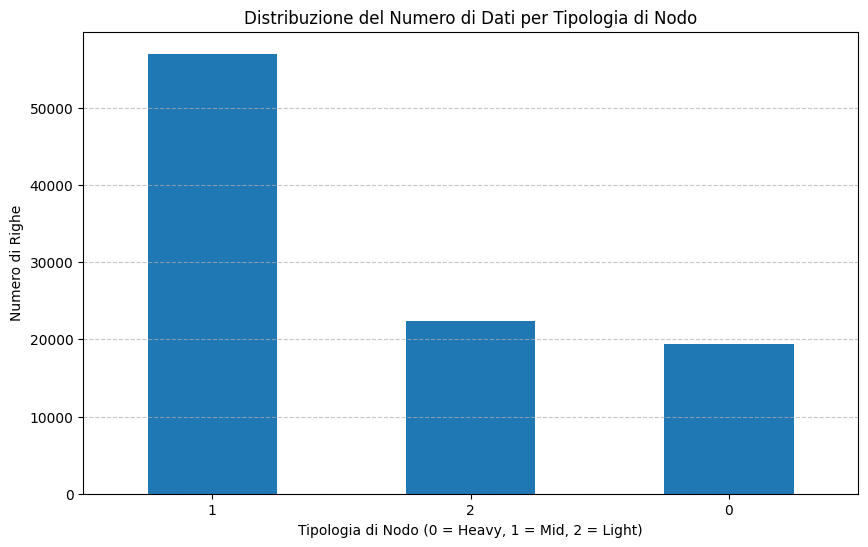

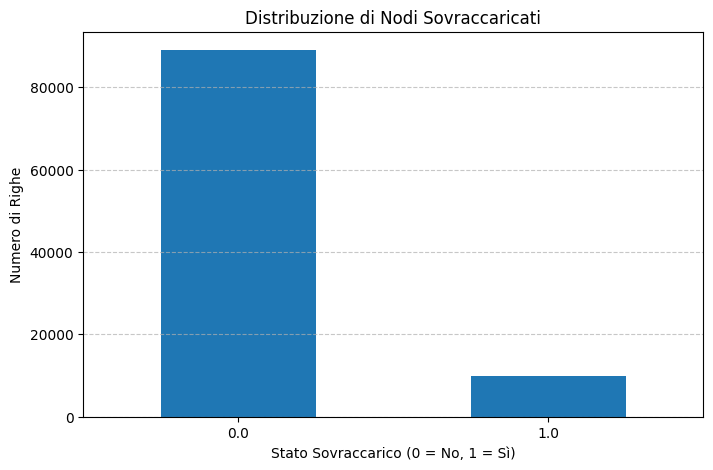

In [293]:
# Plot node type distribution
plot_node_type_distribution(df)
# Plot overloaded node distribution
plot_overloaded_node_distribution(df)

#### Removing outliers

In [294]:
# Iterate over each target column and handle outliers
functions_column = [col for col in df if col.startswith('rate')]
targets = [col for col in df if (col.startswith('power_usage_') or col.startswith('cpu_usage_') or col.startswith('ram_usage_') or col.startswith('overloaded_node') or col.startswith('medium_latency')) and 'idle' not in col]
grouped = df.groupby(functions_column + ['node_type'])
threshold = 1
for target in targets:
    print(target)
    if target != 'overloaded_node':
        mean = grouped[target].transform('mean')
        std = grouped[target].transform('std')
        outliers = (df[target] > mean + threshold * std) | (df[target] < mean - threshold * std)
        print(outliers.sum())
        df[target] = df[target].where(~outliers, mean)
    else:
        new_overloaded = grouped[target].transform('all')
        df['overloaded_node'] = new_overloaded.astype(int)
        print(df["overloaded_node"].value_counts())
df_only_useful = df[functions_column + targets + ["node_type"]]

cpu_usage_function_shasum
23887
ram_usage_function_shasum
23430
power_usage_function_shasum
23895
medium_latency_function_shasum
23610
cpu_usage_function_curl
14017
ram_usage_function_curl
13650
power_usage_function_curl
13997
medium_latency_function_curl
13920
cpu_usage_function_eat-memory
4571
ram_usage_function_eat-memory
4501
power_usage_function_eat-memory
4595
medium_latency_function_eat-memory
4564
cpu_usage_node
32752
ram_usage_node
32400
ram_usage_node_percentage
32140
power_usage_node
32498
overloaded_node
overloaded_node
0    90739
1     8045
Name: count, dtype: int64
cpu_usage_function_nmap
7319
ram_usage_function_nmap
7245
power_usage_function_nmap
7318
medium_latency_function_nmap
7301
cpu_usage_function_env
19397
ram_usage_function_env
18812
power_usage_function_env
19415
medium_latency_function_env
19202
cpu_usage_function_figlet
19900
ram_usage_function_figlet
19762
power_usage_function_figlet
19876
medium_latency_function_figlet
19790


In [295]:
df_only_useful.to_csv(
  os.path.join(PATH_TO_CVS, "all_results_no_outliers.csv"), index = False
)
df_only_useful

,rate_function_shasum,rate_function_curl,rate_function_eat-memory,rate_function_nmap,rate_function_env,rate_function_figlet,cpu_usage_function_shasum,ram_usage_function_shasum,power_usage_function_shasum,medium_latency_function_shasum,...,medium_latency_function_nmap,cpu_usage_function_env,ram_usage_function_env,power_usage_function_env,medium_latency_function_env,cpu_usage_function_figlet,ram_usage_function_figlet,power_usage_function_figlet,medium_latency_function_figlet,node_type
0,100.0,60.0,0.0,0.0,0.0,0.0,7.691,4042069.333,11739.653000,37454241.5,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000,0.000000,0.000000e+00,2
1,100.0,60.0,0.0,0.0,0.0,0.0,7.751,9199274.667,13542.554250,16880204.0,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000,0.000000,0.000000e+00,2
2,100.0,60.0,0.0,0.0,0.0,0.0,8.378,9214634.667,14245.149000,35575151.0,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000,0.000000,0.000000e+00,2
3,100.0,60.0,10.0,0.0,0.0,0.0,8.261,1366357.333,20280.961333,76360433.0,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000,0.000000,0.000000e+00,2
4,100.0,60.0,10.0,0.0,0.0,0.0,7.820,1323008.000,17732.391000,87032021.0,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000,0.000000,0.000000e+00,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98779,0.0,0.0,0.0,70.0,20.0,70.0,0.000,0.000,0.000000,0.0,...,1.655140e+10,2.024333,1.616555e+06,8605.155000,1.278133e+07,10.196000,5607879.111,27201.168000,1.611891e+07,0
98780,0.0,0.0,0.0,70.0,20.0,70.0,0.000,0.000,0.000000,0.0,...,1.697898e+10,2.011000,1.553067e+06,8346.938000,1.207876e+07,10.012000,1713152.000,27538.105000,1.596136e+07,0
98781,0.0,0.0,0.0,70.0,30.0,70.0,0.000,0.000,0.000000,0.0,...,1.728170e+10,2.889333,1.520640e+06,12787.386333,1.444850e+07,9.990167,7250379.020,28735.254833,1.522533e+07,0
98782,0.0,0.0,0.0,70.0,30.0,70.0,0.000,0.000,0.000000,0.0,...,1.793603e+10,2.822000,1.727829e+06,13041.002000,1.444850e+07,9.619000,7250379.020,28618.911000,2.362620e+07,0


#### Partitioning into features and targets and oversampling

In [296]:
# Dataframe division by features and output
targets = [col for col in df if (col.startswith('power_usage_') or col.startswith('cpu_usage_') or col.startswith('ram_usage_') or col.startswith('overloaded_node') or col.startswith('medium_latency')) and 'idle' not in col]# or col.startswith('replica')
params = [col for col in df if col.startswith('rate_') or 'node_type' in col]

# Initialize a dictionary to store target datasets
target_datasets = {}
features_datasets = {}
features_datasets['original'] = df[params]
for target_name in targets:
    X = df[params]
    y = df[[target_name]]
    node_type_index = X.columns.get_loc("node_type")

    if "overloaded" in target_name:
        print("Status of target: " + target_name)
        print(y.value_counts())
        # Oversampling
        sm = SMOTENC(random_state=42, categorical_features=[node_type_index])
        try:
            X_res, y_res = sm.fit_resample(X, y)
            print("Status after SMOTE:")
            print(y_res.value_counts())
            print(X_res["node_type"].value_counts())
            features_datasets[target_name] = X_res
            y = y_res
        except:
            print("It was not possible to perform SMOTE for target " + target_name)
    else:
        if "node" not in target_name:
            function_name = target_name.split("_")[-1]
            # Drop rows whose input rate is zero
            X_res = df[df[f"rate_function_{function_name}"] > 0][params]
            y = df[df[f"rate_function_{function_name}"] > 0][[target_name]]
            features_datasets[target_name] = X_res
        else:
            # Drop rows where input rate is zero for all functions
            X_res = df[df[params].ne(0).sum(axis=1).ge(2)][params]
            y = df[df[params].ne(0).sum(axis=1).ge(2)][[target_name]]
            features_datasets[target_name] = X_res

    target_datasets[target_name] = y

Status of target: overloaded_node
overloaded_node
0                  90739
1                   8045
Name: count, dtype: int64
Status after SMOTE:
overloaded_node
0                  90739
1                  90739
Name: count, dtype: int64
node_type
1    84236
2    65824
0    31418
Name: count, dtype: int64


#### Preprocessing

In [297]:
# Initialize dictionaries to store scaled data and train-test splits
x_train_dict, x_test_dict, y_train_dict, y_test_dict, y_scalers = build_train_test_data(targets, target_datasets, features_datasets)

#### Train models

In [298]:
# Train one model per target variable
trained_models = train_all_models(targets, x_train_dict, y_train_dict)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 103
[LightGBM] [Info] Number of data points in the train set: 54008, number of used features: 7
[LightGBM] [Info] Start training from score 0.278187
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 103
[LightGBM] [Info] Number of data points in the train set: 54008, number of used features: 7
[LightGBM] [Info] Start training from score 0.037612
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

#### Predict

In [299]:
# Compute predictions on the test set
all_predictions = evaluate_all_models(trained_models, targets, params, x_test_dict, y_test_dict)

#### Plot results

Target: cpu_usage_function_shasum
mape: 46900926010.85978
mse: 0.000289338437275503
rmse: 0.017009951125018054
R-squared score: 0.9888114124370865
Standard deviation: 0.15995029092022503


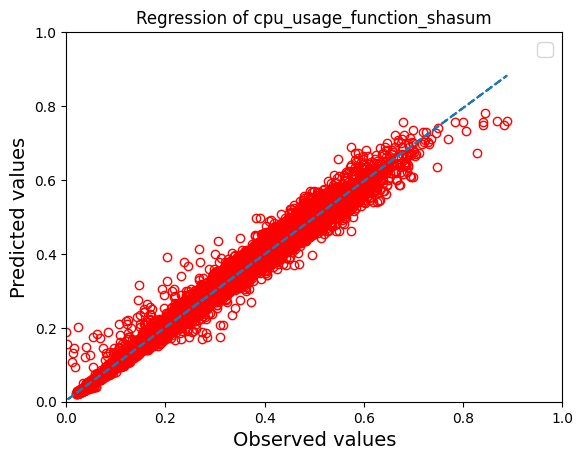

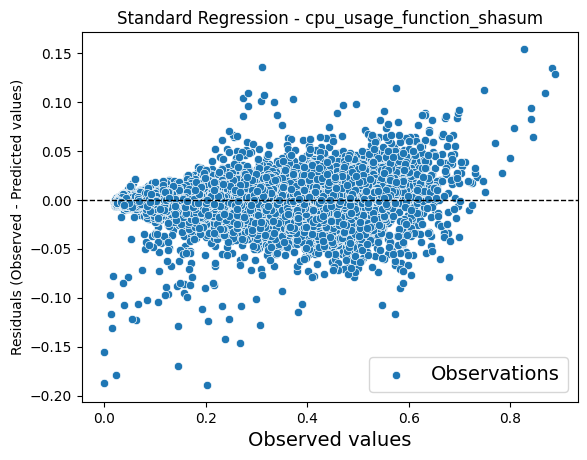

mape: 0.06118828443394699
mse: 0.3007248078075569
rmse: 0.5483838143194572
R-squared score: 0.9888114124370865
Standard deviation: 5.156637428977136
------------------------------
Target: cpu_usage_function_shasum quantiles
Prediction for alpha 0.05 are greater than true values in 5.143587179914459 % of cases and less or equal in 94.85641282008555 % of cases.
mape: 22565110107.0723
mse: 0.0019249950364306331
rmse: 0.04387476537180151
R-squared score: 0.9255613055559223
Standard deviation: 0.14017769638080266
Quantile loss with library:  0.0018081199161581922
Prediction for alpha 0.95 are greater than true values in 95.43964894739766 % of cases and less or equal in 4.560351052602344 % of cases.
mape: 89766516896.72327
mse: 0.0011466814589409912
rmse: 0.033862685347458656
R-squared score: 0.9556583424209398
Standard deviation: 0.16844211189808794
Quantile loss with library:  0.001565772073821964


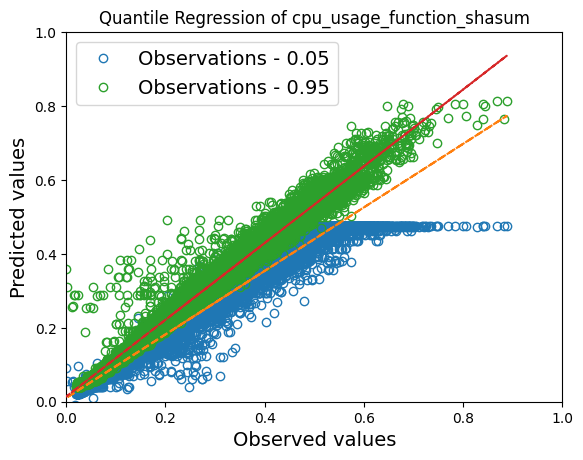

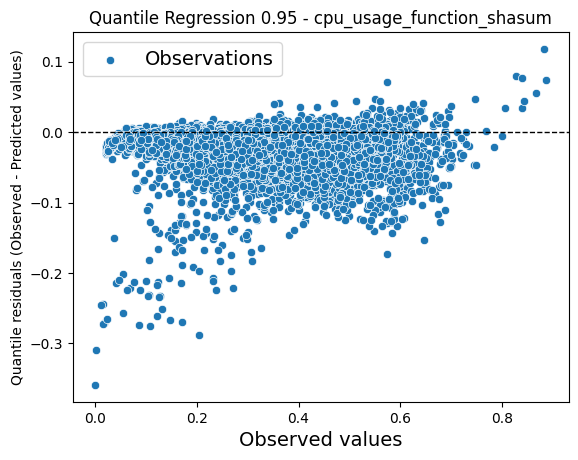

mape: 0.1660018172176098
mse: 1.191806953143153
rmse: 1.0916991129167197
R-squared score: 0.9556583424209398
Standard deviation: 5.430405245482458
Quantile loss with library:  0.05047892588794631
------------------------------
Target: ram_usage_function_shasum
mape: 3.7309888611000215
mse: 0.00297594027720811
rmse: 0.05455217939925141
R-squared score: 0.8350323539233442
Standard deviation: 0.11913813082849053


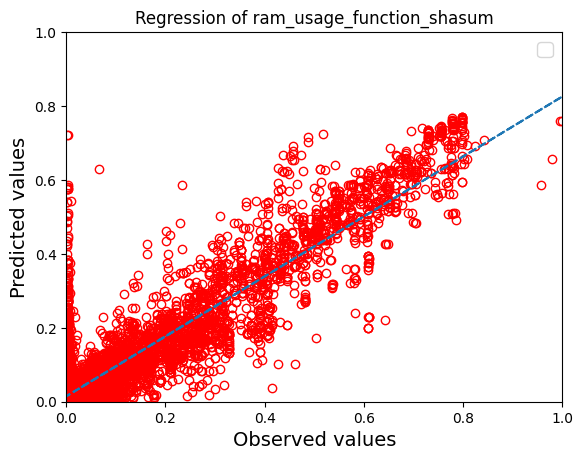

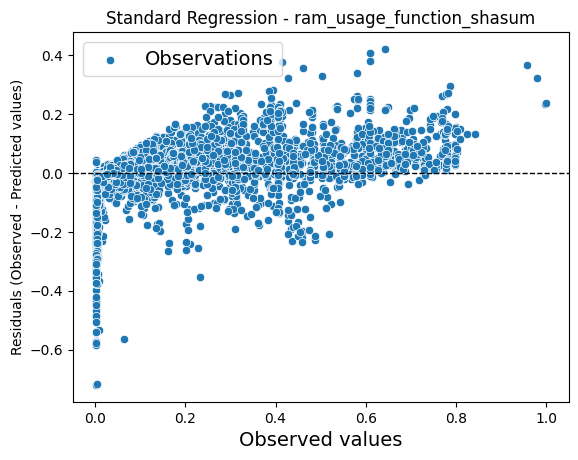

mape: 1.9408305535182897
mse: 177450756207204.97
rmse: 13321064.37966595
R-squared score: 0.8350323539233441
Standard deviation: 29092269.608960204
------------------------------
Target: ram_usage_function_shasum quantiles
Prediction for alpha 0.05 are greater than true values in 5.343553852135755 % of cases and less or equal in 94.65644614786424 % of cases.
mape: 0.6944194884018332
mse: 0.017459895034570128
rmse: 0.13213589608645385
R-squared score: 0.0321318587412287
Standard deviation: 0.040720867240794704
Quantile loss with library:  0.003524353081183385
Prediction for alpha 0.95 are greater than true values in 95.20635449647281 % of cases and less or equal in 4.79364550352719 % of cases.
mape: 10.879063733306754
mse: 0.009705131704688664
rmse: 0.09851462685656716
R-squared score: 0.4620077746693134
Standard deviation: 0.1481219287173521
Quantile loss with library:  0.003756430397015781


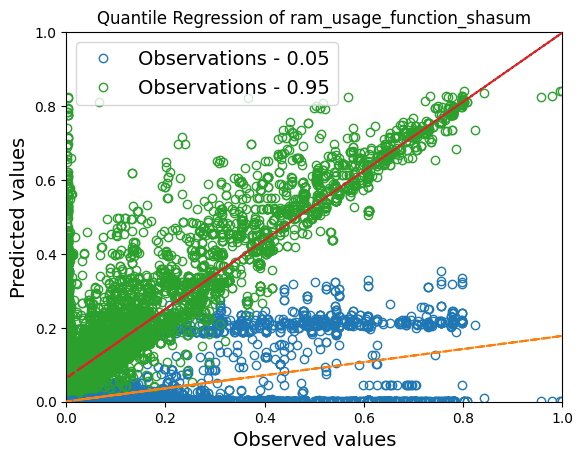

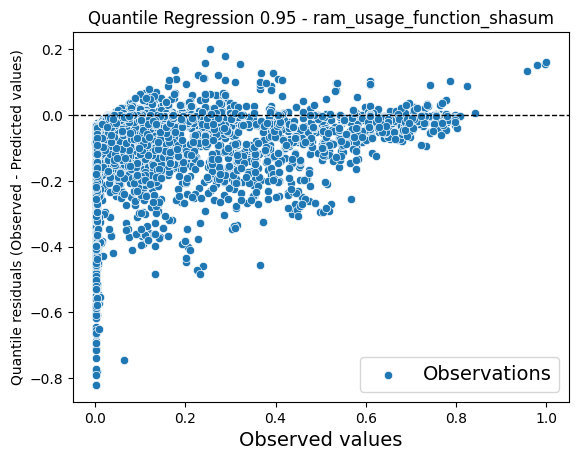

mape: 5.548184719443999
mse: 578702124258755.6
rmse: 24056228.388065234
R-squared score: 0.4620077746693134
Standard deviation: 36169806.05015414
Quantile loss with library:  917280.5139489623
------------------------------
Target: power_usage_function_shasum
mape: 0.11431505231448284
mse: 0.0012402294394811806
rmse: 0.03521689139434627
R-squared score: 0.9472679927081433
Standard deviation: 0.14845680170223433


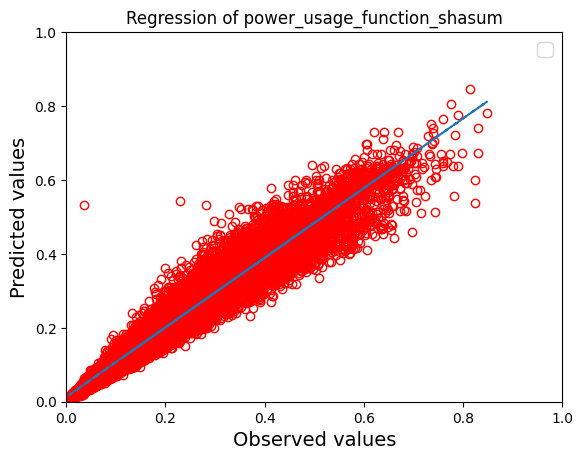

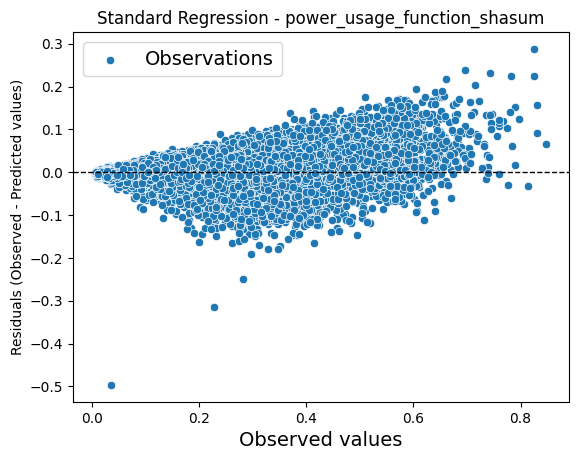

mape: 0.11312552111502527
mse: 8449822.404071452
rmse: 2906.857823160853
R-squared score: 0.9472679927081433
Standard deviation: 12253.85882579231
------------------------------
Target: power_usage_function_shasum quantiles
Prediction for alpha 0.05 are greater than true values in 5.06582236293951 % of cases and less or equal in 94.93417763706049 % of cases.
mape: 0.21183339208209095
mse: 0.005568899224514685
rmse: 0.0746250576181666
R-squared score: 0.7632218481786981
Standard deviation: 0.11143426609374486
Quantile loss with library:  0.003053791395939145
Prediction for alpha 0.95 are greater than true values in 94.78975726267845 % of cases and less or equal in 5.210242737321558 % of cases.
mape: 0.3118889120394208
mse: 0.004993985354392304
rmse: 0.07066813535386585
R-squared score: 0.7876660045794404
Standard deviation: 0.17707820400483537
Quantile loss with library:  0.003310492033289416


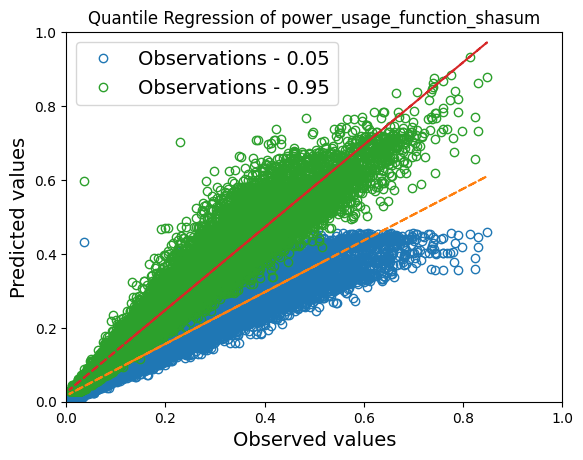

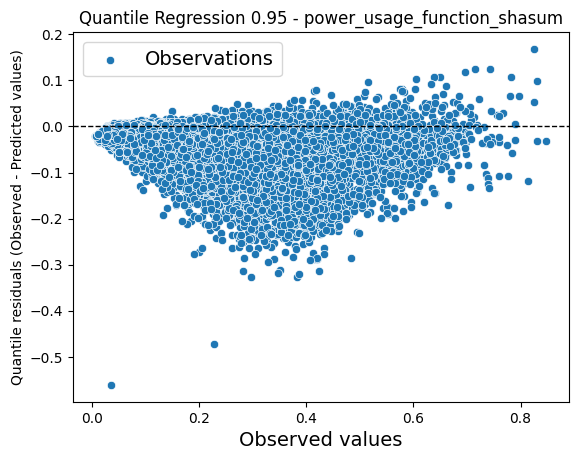

mape: 0.3075060119966805
mse: 34024582.86331391
rmse: 5833.0594770938105
R-squared score: 0.7876660045794405
Standard deviation: 14616.314565043234
Quantile loss with library:  273.2532396946289
------------------------------
Target: medium_latency_function_shasum
mape: 11561646.168295335
mse: 0.00020642913212360868
rmse: 0.014367641842821969
R-squared score: 0.8751610428164954
Standard deviation: 0.03766108912076984


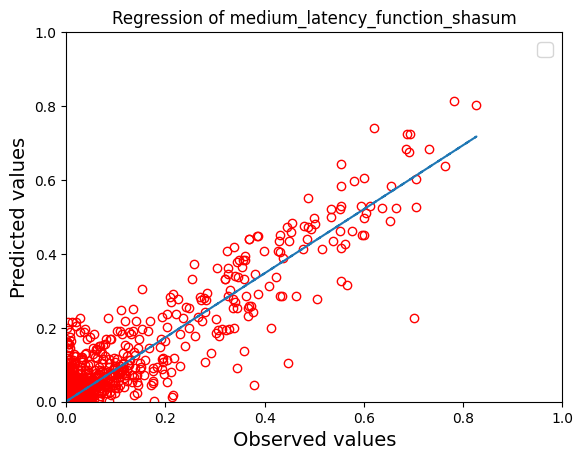

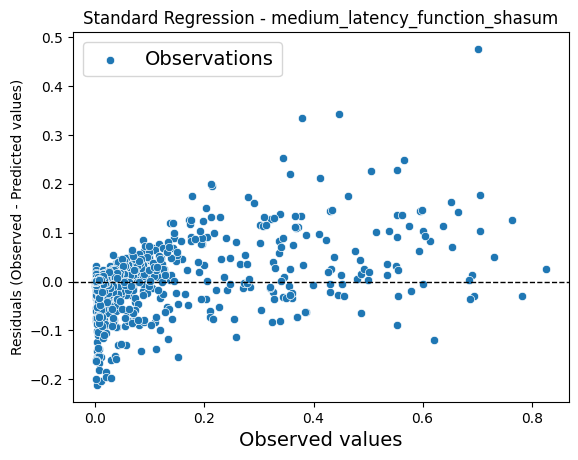

mape: 1.1331740276804336
mse: 1.2065796254088645e+17
rmse: 347358550.40704906
R-squared score: 0.8751610428164955
Standard deviation: 910511374.5772398
------------------------------
Target: medium_latency_function_shasum quantiles
Prediction for alpha 0.05 are greater than true values in 5.399100149975005 % of cases and less or equal in 94.600899850025 % of cases.
mape: 2202466.12104557
mse: 0.0016721038763198247
rmse: 0.04089136677001424
R-squared score: -0.011212429538617341
Standard deviation: 0.0003432095762450429
Quantile loss with library:  0.00028623319580730266
Prediction for alpha 0.95 are greater than true values in 94.96750541576404 % of cases and less or equal in 5.032494584235961 % of cases.
mape: 49379325.52595885
mse: 0.0009069867393214592
rmse: 0.0301162205351445
R-squared score: 0.45149564137895937
Standard deviation: 0.05534566532221038
Quantile loss with library:  0.0005765449284968922


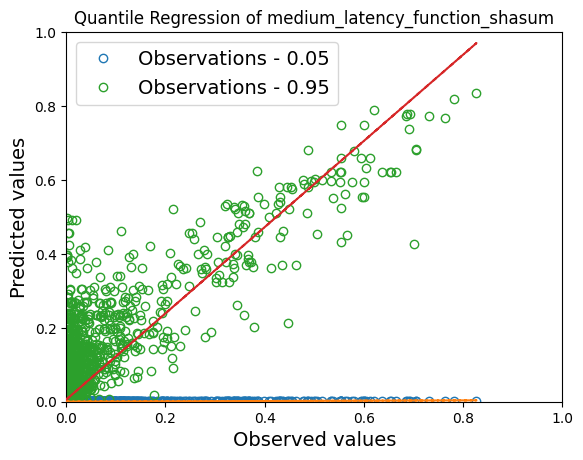

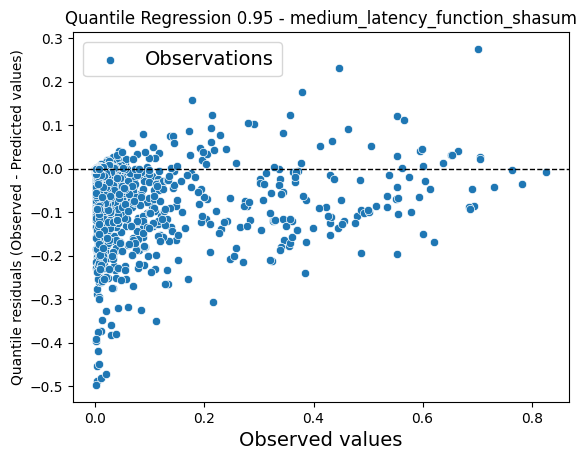

mape: 2.432654496568864
mse: 5.301343414678513e+17
rmse: 728103249.1809464
R-squared score: 0.4514956413789595
Standard deviation: 1338061617.0663617
Quantile loss with library:  13938808.66450394
------------------------------
Target: cpu_usage_function_curl
mape: 0.5058489496912756
mse: 0.0005256232717350494
rmse: 0.022926475344785327
R-squared score: 0.985996732155083
Standard deviation: 0.19177914067375657


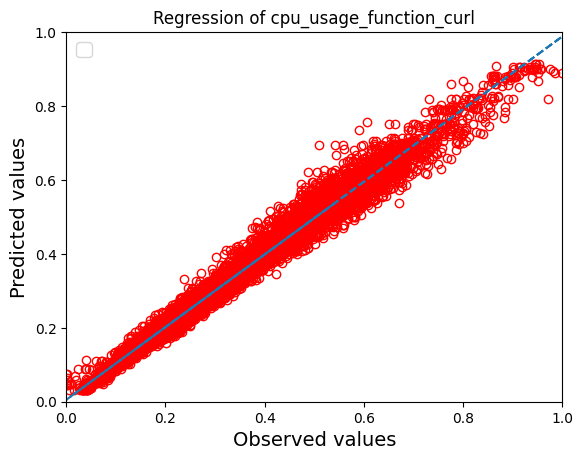

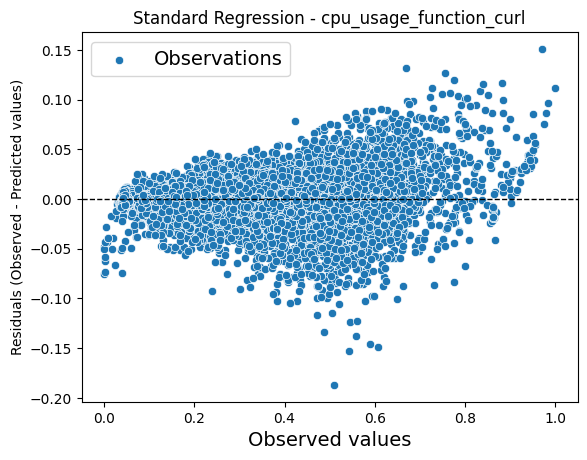

mape: 0.12432128372981803
mse: 8.788171125391962
rmse: 2.9644849679821217
R-squared score: 0.985996732155083
Standard deviation: 24.797810005679416
------------------------------
Target: cpu_usage_function_curl quantiles
Prediction for alpha 0.05 are greater than true values in 5.575045036503271 % of cases and less or equal in 94.42495496349673 % of cases.
mape: 0.19399828597145283
mse: 0.004356501370715406
rmse: 0.06600379815370784
R-squared score: 0.8839373010264526
Standard deviation: 0.1567037686913862
Quantile loss with library:  0.0024345415908382604
Prediction for alpha 0.95 are greater than true values in 95.46790556556367 % of cases and less or equal in 4.532094434436332 % of cases.
mape: 1.1347783585158253
mse: 0.002377791643592008
rmse: 0.04876260497135082
R-squared score: 0.9366526273566358
Standard deviation: 0.20306018606761633
Quantile loss with library:  0.002234169956599378


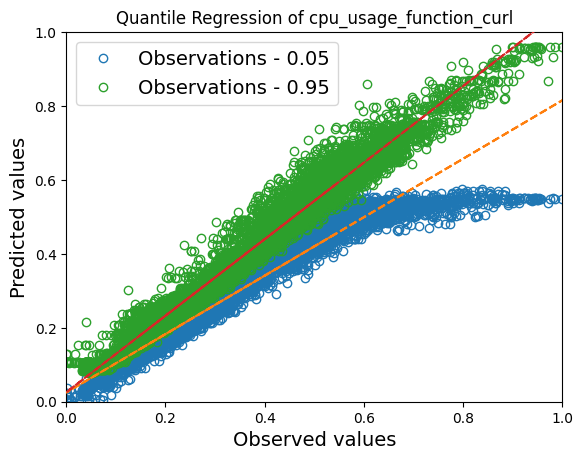

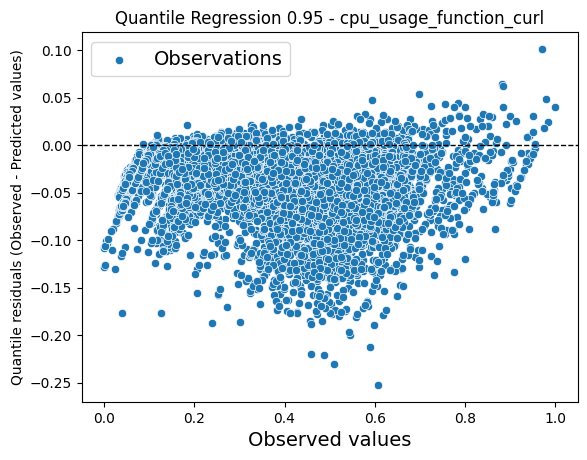

mape: 0.35101015683050873
mse: 39.75554544119734
rmse: 6.305199873215546
R-squared score: 0.9366526273566358
Standard deviation: 26.25649429928706
Quantile loss with library:  0.288887112068126
------------------------------
Target: ram_usage_function_curl
mape: 17.565082497369627
mse: 0.025752870559015345
rmse: 0.16047700944065274
R-squared score: 0.6504487517795031
Standard deviation: 0.20877110201968532


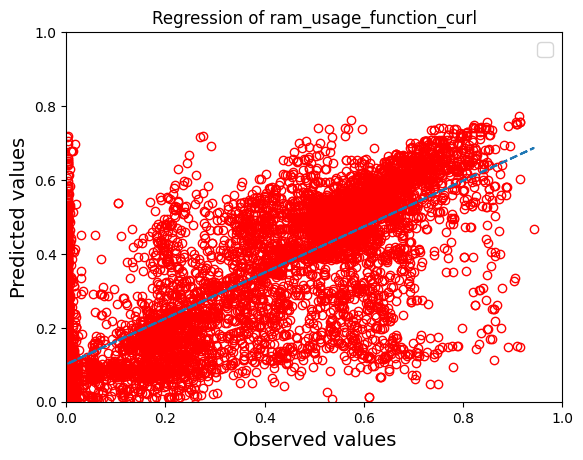

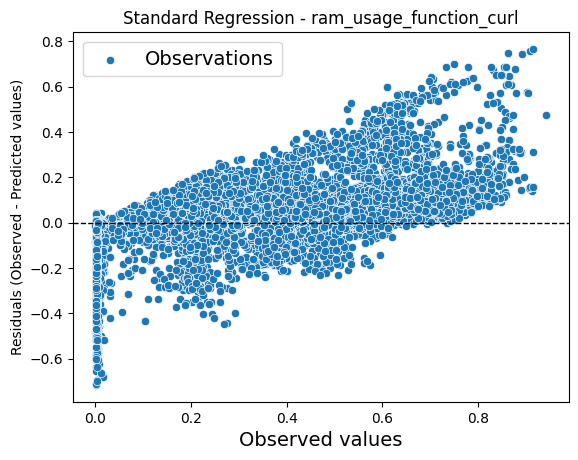

mape: 8.101603993249897
mse: 2146494572864184.0
rmse: 46330277.06440125
R-squared score: 0.6504487517795031
Standard deviation: 60272951.454703145
------------------------------
Target: ram_usage_function_curl quantiles
Prediction for alpha 0.05 are greater than true values in 5.489712714515976 % of cases and less or equal in 94.51028728548403 % of cases.
mape: 0.7888264647921273
mse: 0.09247502076184236
rmse: 0.3040970581275695
R-squared score: -0.255190517982951
Standard deviation: 0.118758938415387
Quantile loss with library:  0.010974317133248793
Prediction for alpha 0.95 are greater than true values in 94.70939603678771 % of cases and less or equal in 5.290603963212288 % of cases.
mape: 67.33559031489493
mse: 0.11421466444078815
rmse: 0.3379566014161998
R-squared score: -0.5502690633602585
Standard deviation: 0.20144411248453944
Quantile loss with library:  0.013942733933559272


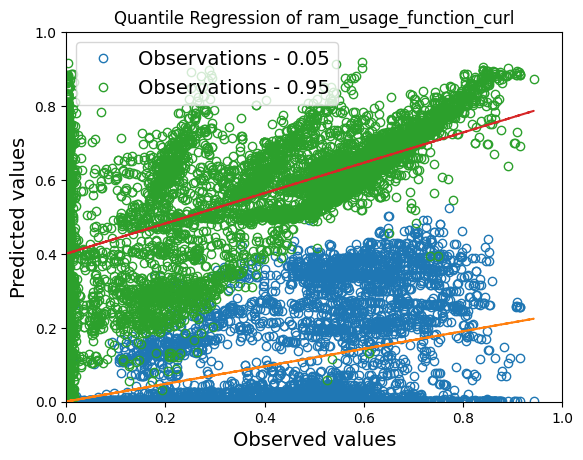

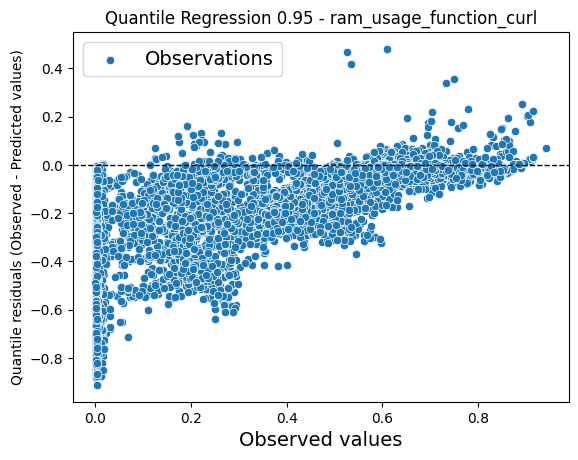

mape: 31.13803739235947
mse: 9519760401149988.0
rmse: 97569259.50907892
R-squared score: -0.5502690633602583
Standard deviation: 58157623.80500129
Quantile loss with library:  4025316.3267970895
------------------------------
Target: power_usage_function_curl
mape: 0.12007960192331905
mse: 0.0012413385999093937
rmse: 0.03523263543803378
R-squared score: 0.9509297225936544
Standard deviation: 0.15473268278405422


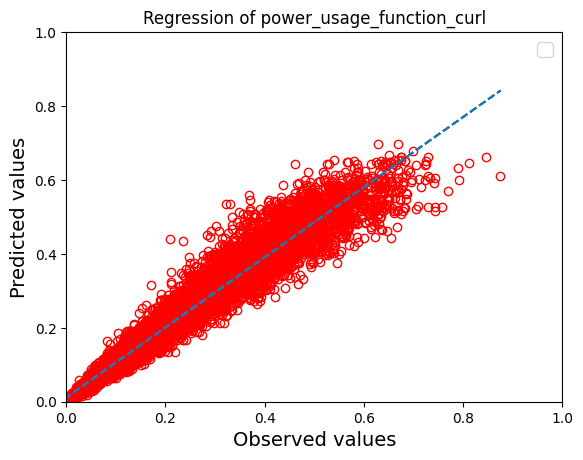

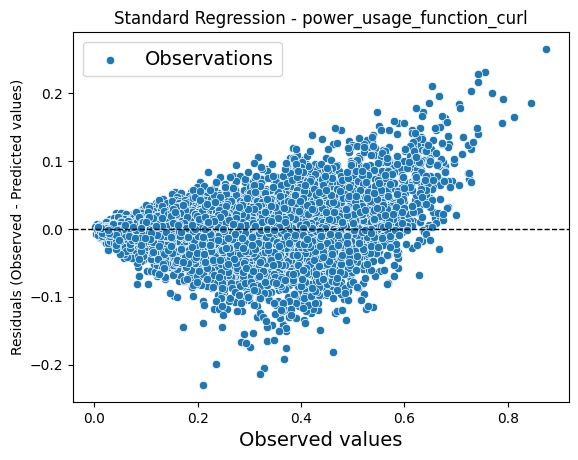

mape: 0.10799861268668651
mse: 20523968.549327802
rmse: 4530.338679318335
R-squared score: 0.9509297225936544
Standard deviation: 19896.08353323952
------------------------------
Target: power_usage_function_curl quantiles
Prediction for alpha 0.05 are greater than true values in 5.802597895136058 % of cases and less or equal in 94.19740210486395 % of cases.
mape: 0.21701709052738202
mse: 0.004802127032614185
rmse: 0.06929738113820885
R-squared score: 0.8101712895674964
Standard deviation: 0.12279490115308922
Quantile loss with library:  0.003027738178051013
Prediction for alpha 0.95 are greater than true values in 94.8800606807623 % of cases and less or equal in 5.119939319237698 % of cases.
mape: 0.3154874061908092
mse: 0.004722553033071037
rmse: 0.06872083405395366
R-squared score: 0.8133168601895651
Standard deviation: 0.1840659665537792
Quantile loss with library:  0.003242374865411339


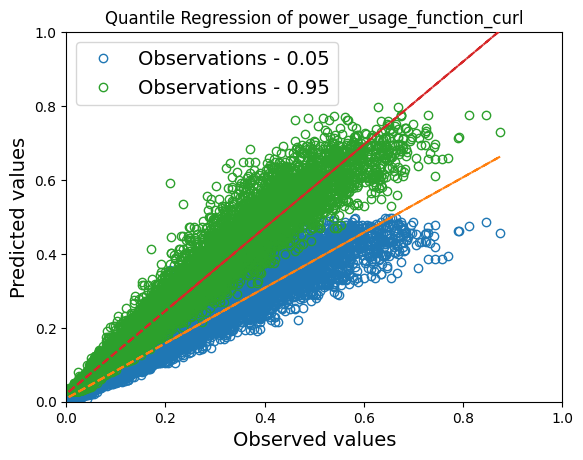

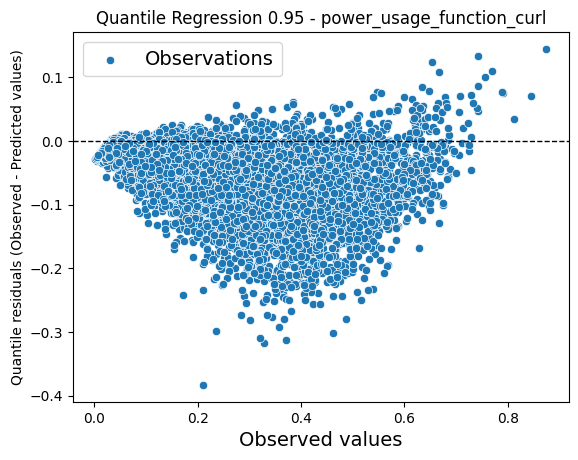

mape: 0.271313535860316
mse: 78081459.74865945
rmse: 8836.371413009949
R-squared score: 0.813316860189565
Standard deviation: 23667.862408172925
Quantile loss with library:  416.9161938356072
------------------------------
Target: medium_latency_function_curl
mape: 0.3689039362689792
mse: 0.0007044290489035529
rmse: 0.026541082285836667
R-squared score: 0.9862170488022899
Standard deviation: 0.2220762596016928


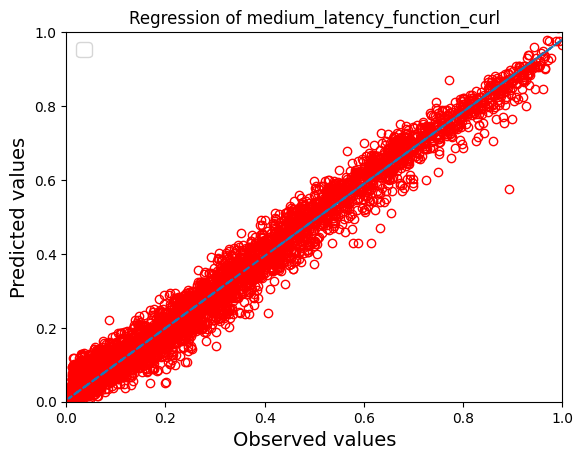

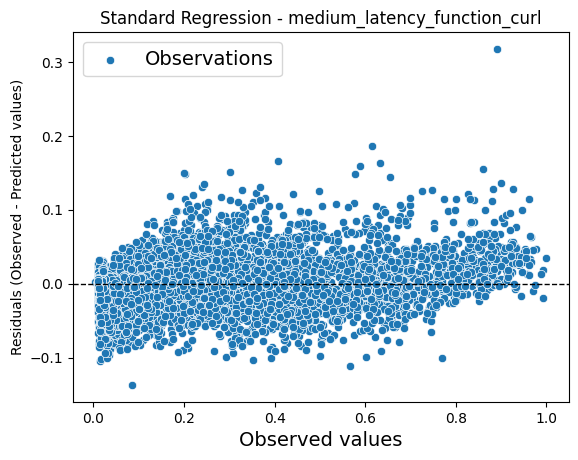

mape: 0.3034504115609393
mse: 5.505018068829374e+17
rmse: 741958089.7078604
R-squared score: 0.9862170488022899
Standard deviation: 6208159696.316043
------------------------------
Target: medium_latency_function_curl quantiles
Prediction for alpha 0.05 are greater than true values in 5.309566701431686 % of cases and less or equal in 94.69043329856831 % of cases.
mape: 0.3037588062040879
mse: 0.02298549707816001
rmse: 0.15160968662377747
R-squared score: 0.5502627482831668
Standard deviation: 0.11787030256863157
Quantile loss with library:  0.003989467595636799
Prediction for alpha 0.95 are greater than true values in 96.435005214753 % of cases and less or equal in 3.5649947852469897 % of cases.
mape: 2.112385379628858
mse: 0.010838775638322053
rmse: 0.10410944067817314
R-squared score: 0.7879270937244166
Standard deviation: 0.2437918317571411
Quantile loss with library:  0.0037098994090946583


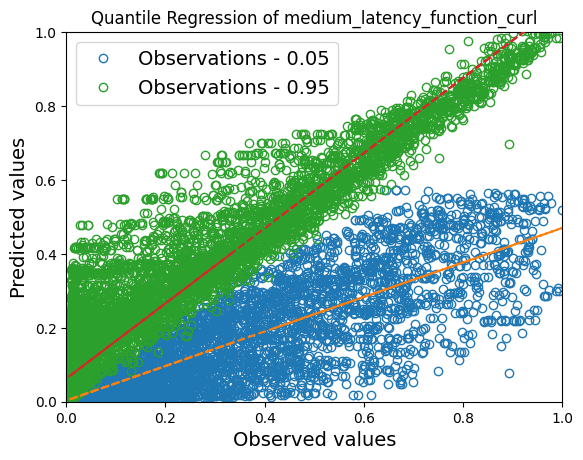

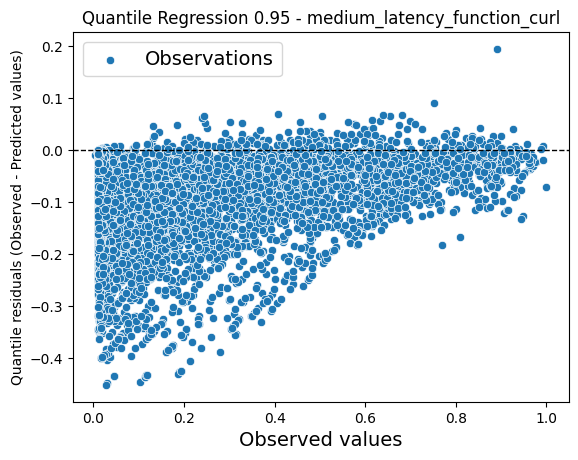

mape: 1.7340659604945556
mse: 8.47035706801466e+18
rmse: 2910387786.5354404
R-squared score: 0.7879270937244165
Standard deviation: 6815220262.266196
Quantile loss with library:  103710536.32764177
------------------------------
Target: cpu_usage_function_eat-memory
mape: 28595882665.96661
mse: 0.0002695266533980732
rmse: 0.016417266928391985
R-squared score: 0.9901246716668608
Standard deviation: 0.1638864858229995


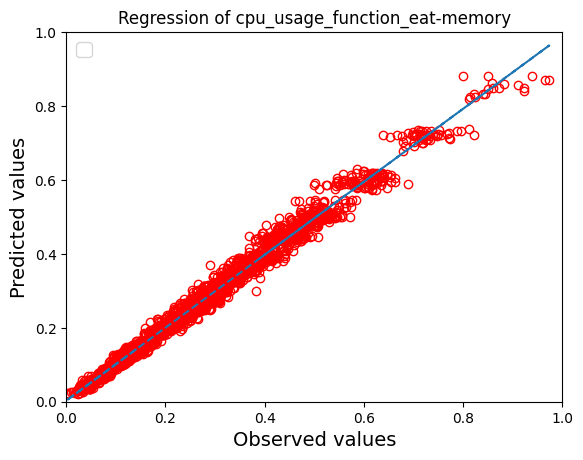

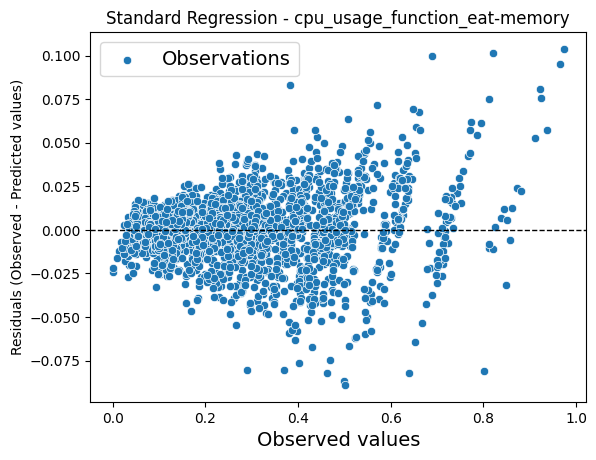

mape: 0.04959997515607104
mse: 25.286907068544675
rmse: 5.028608860166465
R-squared score: 0.9901246716668608
Standard deviation: 50.19843060758475
------------------------------
Target: cpu_usage_function_eat-memory quantiles
Prediction for alpha 0.05 are greater than true values in 6.206496519721578 % of cases and less or equal in 93.79350348027842 % of cases.
mape: 3332229342.5719852
mse: 0.0020180100273840705
rmse: 0.044922266498742806
R-squared score: 0.9260610728151182
Standard deviation: 0.1387237104567181
Quantile loss with library:  0.0017544436268676648
Prediction for alpha 0.95 are greater than true values in 95.01160092807424 % of cases and less or equal in 4.988399071925754 % of cases.
mape: 117088367536.23286
mse: 0.0011776265332070605
rmse: 0.0343165635401778
R-squared score: 0.9568523241667669
Standard deviation: 0.1755881398003019
Quantile loss with library:  0.0015033709496438572


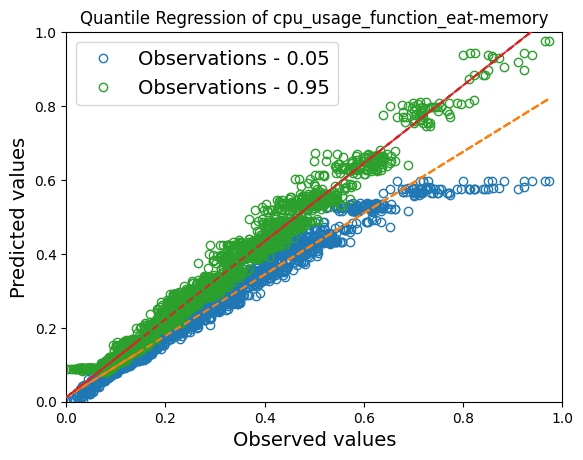

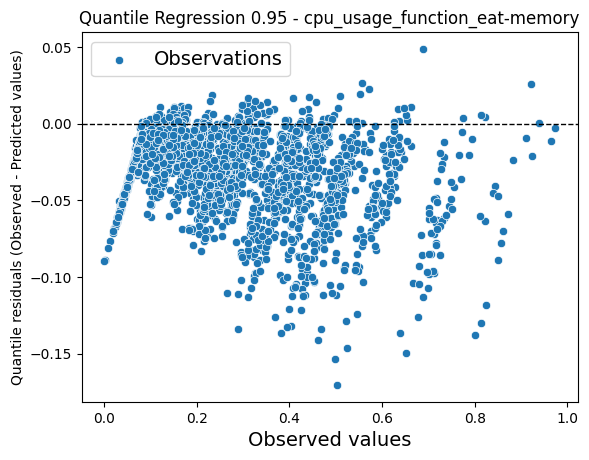

mape: 0.13932998034266456
mse: 110.48455628126112
rmse: 10.511163412356462
R-squared score: 0.9568523241667669
Standard deviation: 53.78264722083248
Quantile loss with library:  0.4604825218759135
------------------------------
Target: ram_usage_function_eat-memory
mape: 4.814528223389494
mse: 0.007102181669554775
rmse: 0.08427444256448556
R-squared score: 0.7718290508839554
Standard deviation: 0.14993100262495668


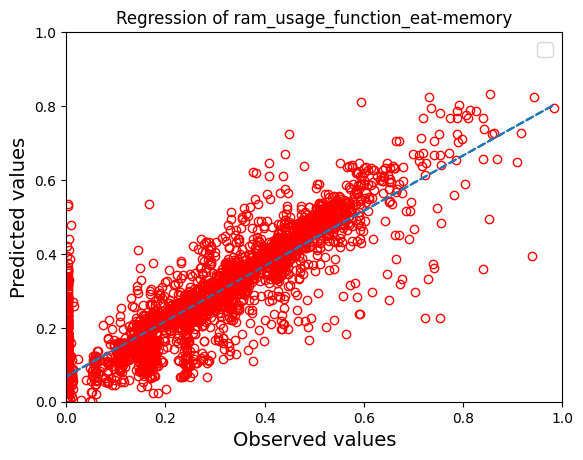

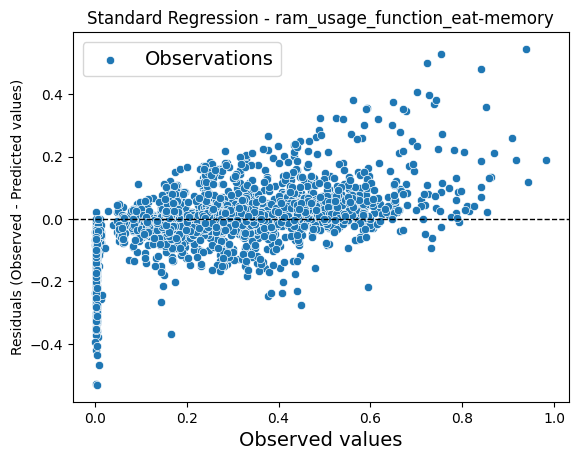

mape: 2.2032772274498194
mse: 733796149656696.9
rmse: 27088671.980307505
R-squared score: 0.7718290508839554
Standard deviation: 48192923.33708796
------------------------------
Target: ram_usage_function_eat-memory quantiles
Prediction for alpha 0.05 are greater than true values in 6.409512761020881 % of cases and less or equal in 93.59048723897911 % of cases.
mape: 0.7335228379165487
mse: 0.03322946006994464
rmse: 0.18228949522653423
R-squared score: -0.06755892703717348
Standard deviation: 0.12713445677711638
Quantile loss with library:  0.00786475862423336
Prediction for alpha 0.95 are greater than true values in 94.37354988399072 % of cases and less or equal in 5.626450116009281 % of cases.
mape: 11.700308073151678
mse: 0.021765283060980394
rmse: 0.14753061736799042
R-squared score: 0.3007493295909185
Standard deviation: 0.15894678867391832
Quantile loss with library:  0.005317745327813253


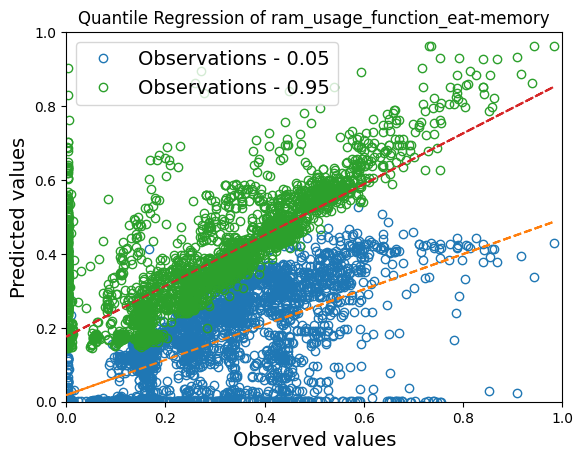

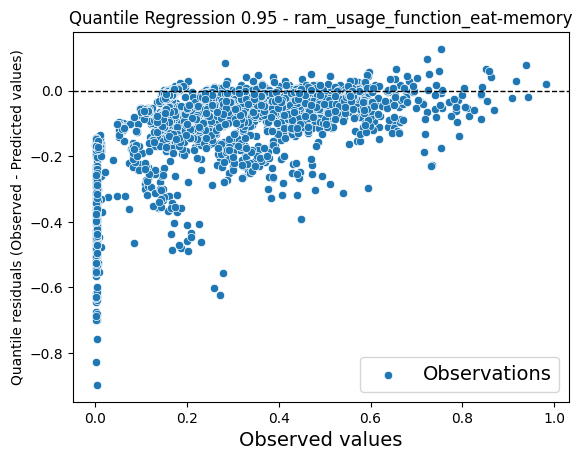

mape: 5.325531480364741
mse: 2248785183122012.2
rmse: 47421357.879356556
R-squared score: 0.3007493295909186
Standard deviation: 51090903.59650144
Quantile loss with library:  1709304.2027506803
------------------------------
Target: power_usage_function_eat-memory
mape: 0.12919263159045533
mse: 0.0005724822378627396
rmse: 0.023926601051188604
R-squared score: 0.9620932923970065
Standard deviation: 0.12012912085992733


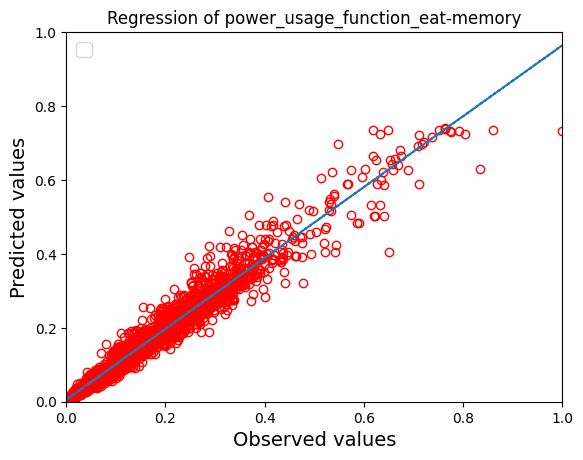

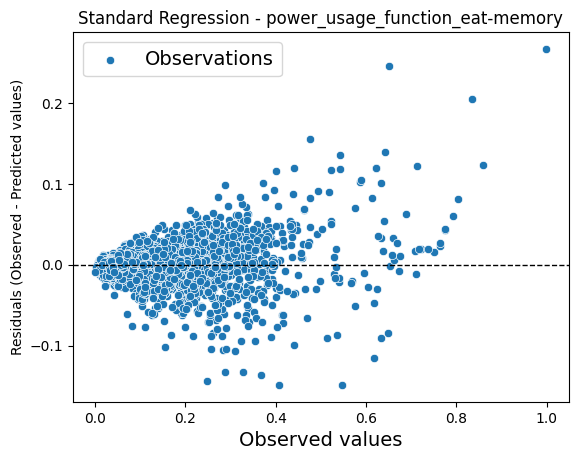

mape: 0.09893380141525467
mse: 1925546.3868253187
rmse: 1387.6405827249787
R-squared score: 0.9620932923970065
Standard deviation: 6966.975497927149
------------------------------
Target: power_usage_function_eat-memory quantiles
Prediction for alpha 0.05 are greater than true values in 5.5974477958236655 % of cases and less or equal in 94.40255220417633 % of cases.
mape: 0.2198154027715754
mse: 0.002805536659021924
rmse: 0.05296731689468444
R-squared score: 0.8142323887636109
Standard deviation: 0.08964057506848871
Quantile loss with library:  0.001936430882493024
Prediction for alpha 0.95 are greater than true values in 93.99651972157773 % of cases and less or equal in 6.003480278422274 % of cases.
mape: 0.33911269950793727
mse: 0.0021317906632653855
rmse: 0.04617131862168748
R-squared score: 0.8588442400503477
Standard deviation: 0.1417489460267989
Quantile loss with library:  0.002098952435167324


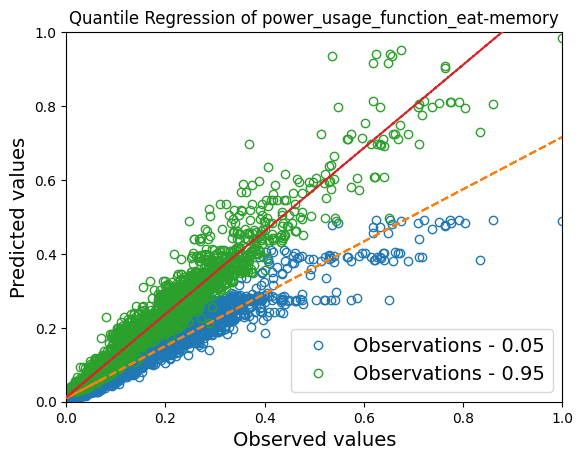

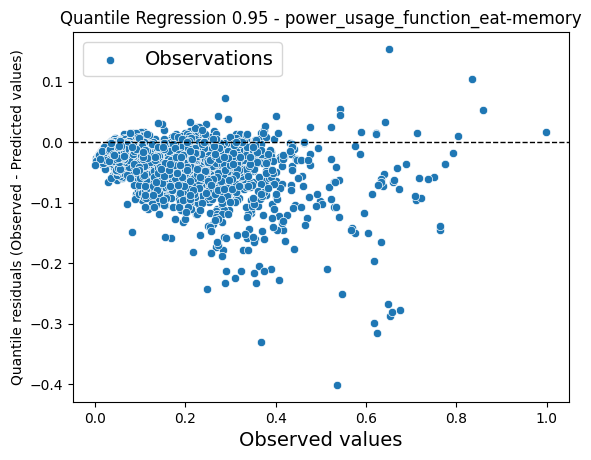

mape: 0.24010645830462737
mse: 7170286.757617814
rmse: 2677.739113061206
R-squared score: 0.8588442400503477
Standard deviation: 8220.832940059721
Quantile loss with library:  121.73026891769528
------------------------------
Target: medium_latency_function_eat-memory
mape: 2.2573247730356876
mse: 0.0014542493413633882
rmse: 0.038134621295659775
R-squared score: 0.9583179819871027
Standard deviation: 0.17709582712903701


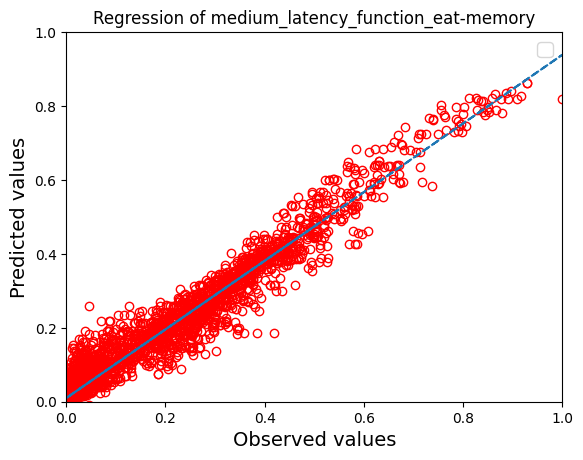

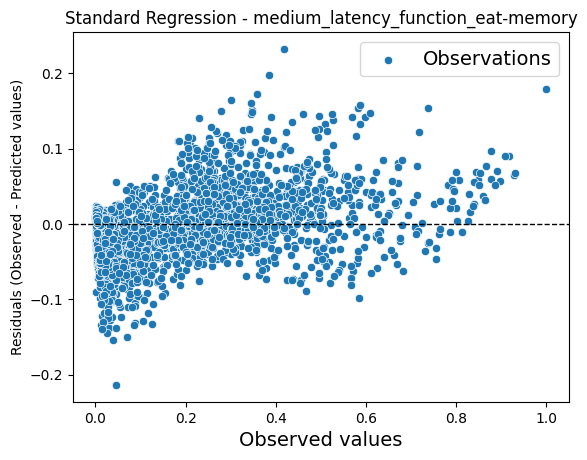

mape: 0.2180841799955204
mse: 1.0039422300236101e+18
rmse: 1001969176.1843824
R-squared score: 0.9583179819871027
Standard deviation: 4653109274.075014
------------------------------
Target: medium_latency_function_eat-memory quantiles
Prediction for alpha 0.05 are greater than true values in 6.206496519721578 % of cases and less or equal in 93.79350348027842 % of cases.
mape: 0.6115226871738635
mse: 0.024389143995979506
rmse: 0.15617024043004962
R-squared score: 0.3009529312170838
Standard deviation: 0.08464850190155875
Quantile loss with library:  0.004959394263480667
Prediction for alpha 0.95 are greater than true values in 94.5475638051044 % of cases and less or equal in 5.452436194895592 % of cases.
mape: 15.767081904401119
mse: 0.016586388631047562
rmse: 0.12878815407888863
R-squared score: 0.5245972406354467
Standard deviation: 0.17869465959467856
Quantile loss with library:  0.005642141562958253


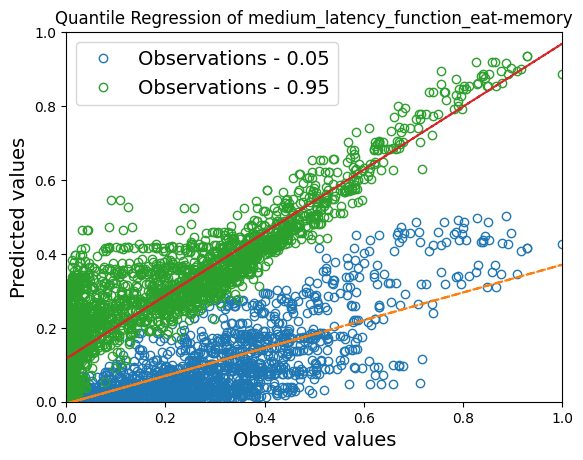

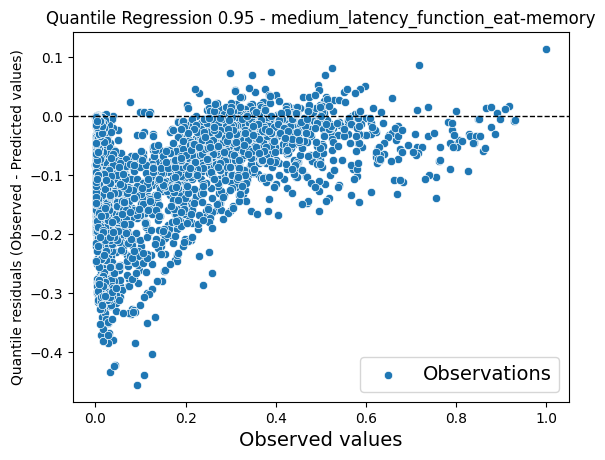

mape: 1.3630335173118753
mse: 1.1450427046218062e+19
rmse: 3383847964.406507
R-squared score: 0.5245972406354467
Standard deviation: 4695117842.510385
Quantile loss with library:  148244606.6508168
------------------------------
Target: cpu_usage_node
mape: 4102761564.1622195
mse: 0.0005670206018376206
rmse: 0.023812194393579535
R-squared score: 0.9835586655356046
Standard deviation: 0.18378583983498084


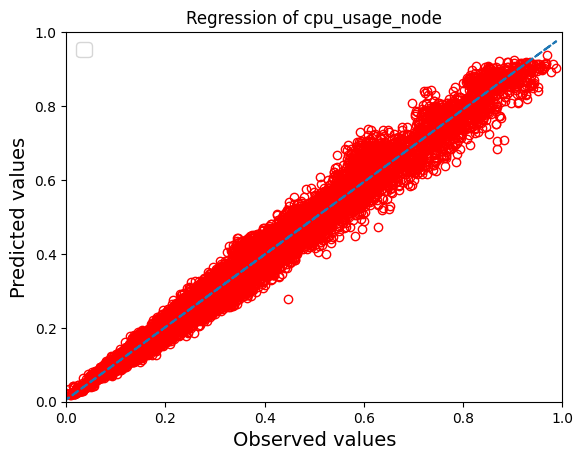

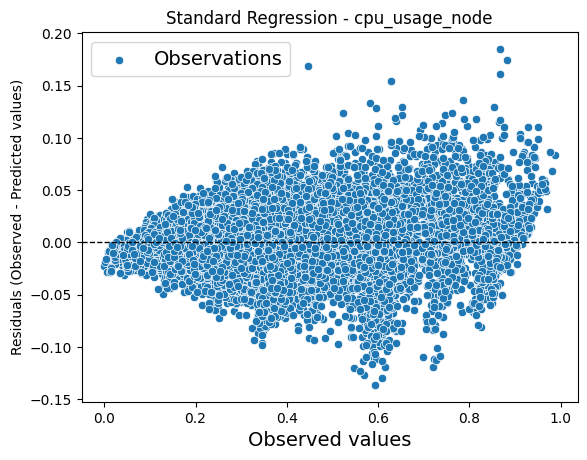

mape: 0.03563055388086608
mse: 96.642306525248
rmse: 9.830681895232294
R-squared score: 0.9835586655356046
Standard deviation: 75.87457495109977
------------------------------
Target: cpu_usage_node quantiles
Prediction for alpha 0.05 are greater than true values in 4.425895765472313 % of cases and less or equal in 95.5741042345277 % of cases.
mape: 1575450428.069929
mse: 0.006330441665368088
rmse: 0.07956407270475845
R-squared score: 0.8164424566050117
Standard deviation: 0.14238758390719297
Quantile loss with library:  0.002847038140071716
Prediction for alpha 0.95 are greater than true values in 95.22394136807819 % of cases and less or equal in 4.776058631921824 % of cases.
mape: 25881666397.625412
mse: 0.0034234264725524857
rmse: 0.058510054456926336
R-squared score: 0.9007342952494348
Standard deviation: 0.1933862419924357
Quantile loss with library:  0.0028912451600897346


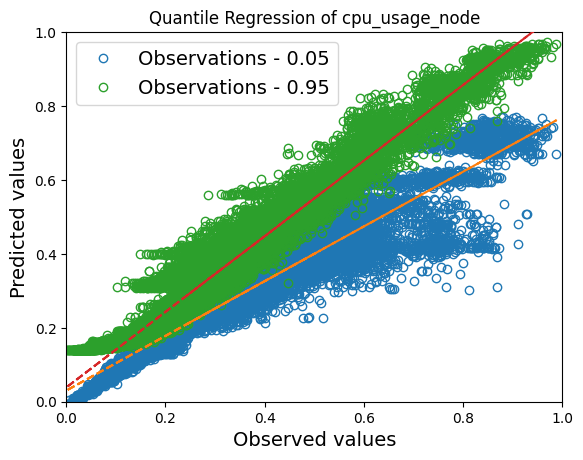

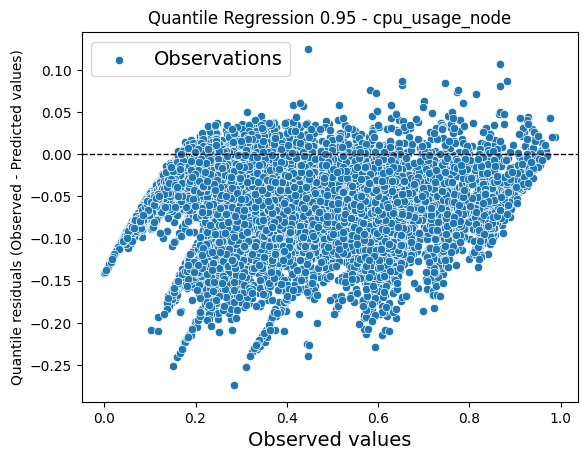

mape: 0.1130003991161688
mse: 583.4846731403453
rmse: 24.155427405457875
R-squared score: 0.9007342952494347
Standard deviation: 79.8380273787218
Quantile loss with library:  1.193628398130153
------------------------------
Target: ram_usage_node
mape: 0.046033908185201054
mse: 0.0008291089636419092
rmse: 0.028794252267456247
R-squared score: 0.9528735485505847
Standard deviation: 0.12644880680292686


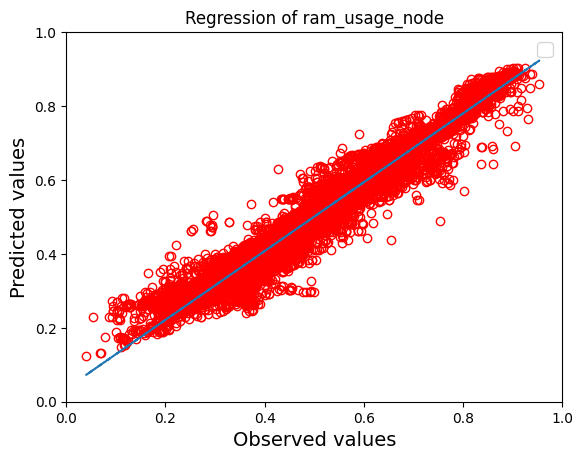

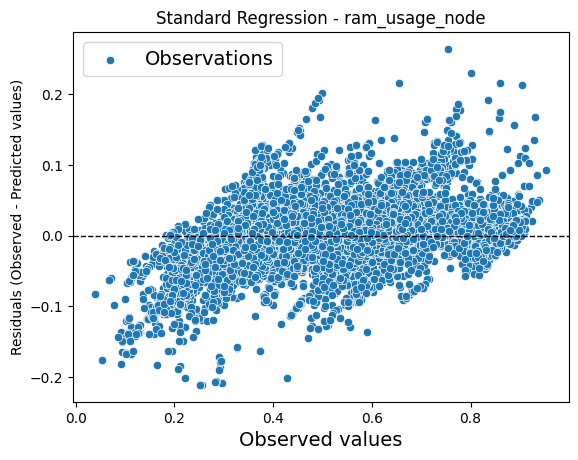

mape: 0.015227080833677846
mse: 9079805331224434.0
rmse: 95288012.52636364
R-squared score: 0.9528735485505847
Standard deviation: 418453494.630214
------------------------------
Target: ram_usage_node quantiles
Prediction for alpha 0.05 are greater than true values in 4.812703583061889 % of cases and less or equal in 95.18729641693811 % of cases.
mape: 0.10805360924552941
mse: 0.005981421498598625
rmse: 0.07733965023581775
R-squared score: 0.6600167381932419
Standard deviation: 0.12104880493412808
Quantile loss with library:  0.003182549994623091
Prediction for alpha 0.95 are greater than true values in 95.0285016286645 % of cases and less or equal in 4.971498371335505 % of cases.
mape: 0.14499236456486805
mse: 0.0062661007746255305
rmse: 0.07915870624653697
R-squared score: 0.643835603181257
Standard deviation: 0.11234186215998003
Quantile loss with library:  0.003469148453336454


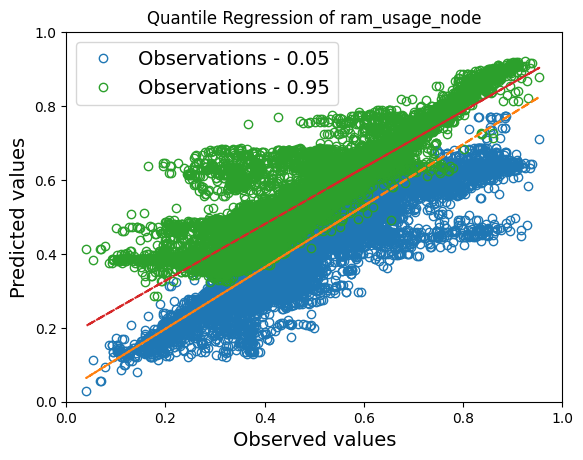

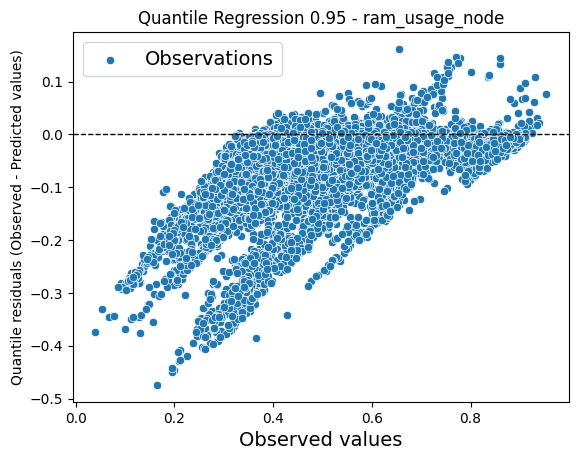

mape: 0.045449156948260516
mse: 6.862183104319599e+16
rmse: 261957689.41414183
R-squared score: 0.643835603181257
Standard deviation: 371769777.8467398
Quantile loss with library:  11480355.80875121
------------------------------
Target: ram_usage_node_percentage
mape: 9669977604.389214
mse: 0.00033710115329734153
rmse: 0.01836031462958469
R-squared score: 0.9929817191181324
Standard deviation: 0.21739875691061322


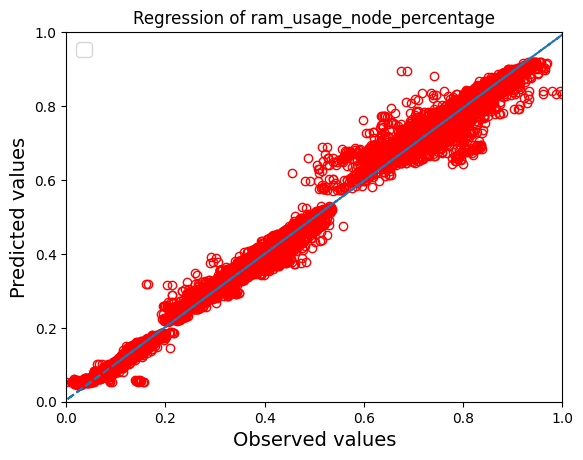

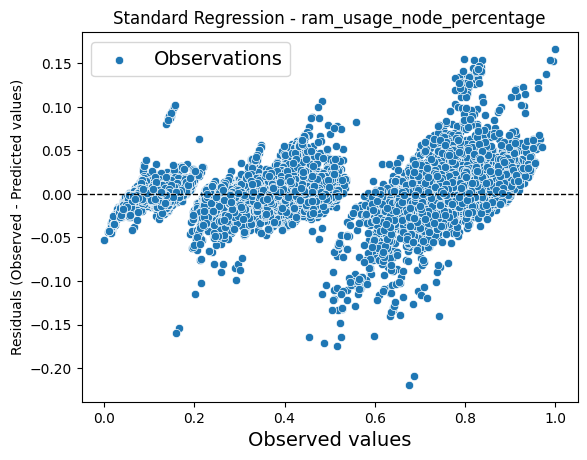

mape: 0.015753881152278465
mse: 0.6520939737776038
rmse: 0.8075233580383937
R-squared score: 0.9929817191181324
Standard deviation: 9.561632126442591
------------------------------
Target: ram_usage_node_percentage quantiles
Prediction for alpha 0.05 are greater than true values in 4.486970684039088 % of cases and less or equal in 95.5130293159609 % of cases.
mape: 2014163440.2230892
mse: 0.0034137836034538404
rmse: 0.058427592826111194
R-squared score: 0.9289266976259194
Standard deviation: 0.18999443538827163
Quantile loss with library:  0.0019910949308018762
Prediction for alpha 0.95 are greater than true values in 95.1913680781759 % of cases and less or equal in 4.808631921824104 % of cases.
mape: 28122600576.491222
mse: 0.002686861967776362
rmse: 0.05183494928883756
R-squared score: 0.9440608499964726
Standard deviation: 0.22122040802690116
Quantile loss with library:  0.0020312730065425067


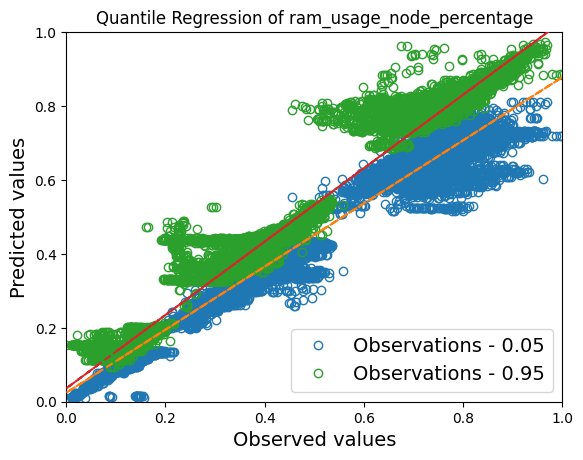

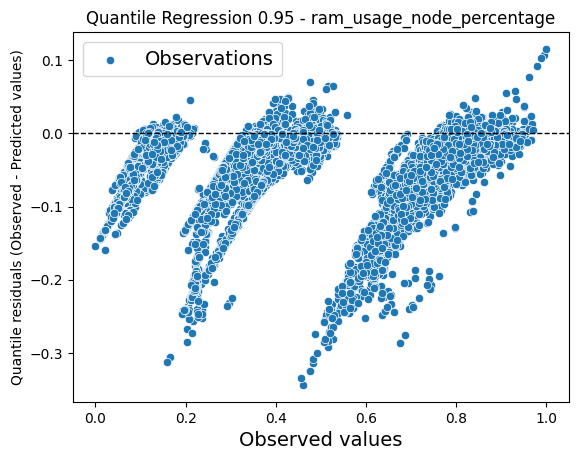

mape: 0.05914365015872022
mse: 5.197509650801357
rmse: 2.2798047396216536
R-squared score: 0.9440608499964726
Standard deviation: 9.729715985839167
Quantile loss with library:  0.08933944937375252
------------------------------
Target: power_usage_node
mape: 0.11649310047965353
mse: 0.0009729999549947686
rmse: 0.031192947199563694
R-squared score: 0.9546165345554878
Standard deviation: 0.142604607607519


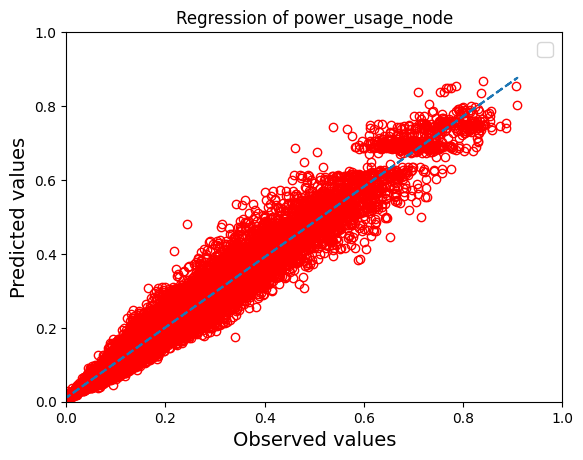

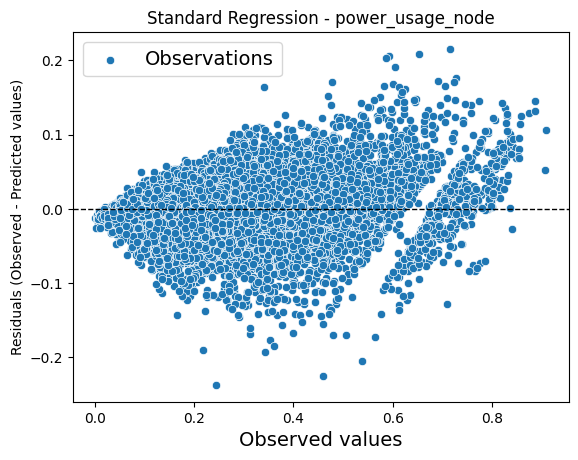

mape: 0.08828264231236556
mse: 15314143637.992422
rmse: 123750.32782983818
R-squared score: 0.9546165345554877
Standard deviation: 565748.6235132905
------------------------------
Target: power_usage_node quantiles
Prediction for alpha 0.05 are greater than true values in 4.906351791530945 % of cases and less or equal in 95.09364820846905 % of cases.
mape: 0.21781727444203405
mse: 0.004748856629478811
rmse: 0.06891194837964466
R-squared score: 0.7784999170467038
Standard deviation: 0.11333791003218203
Quantile loss with library:  0.0030026473523848277
Prediction for alpha 0.95 are greater than true values in 95.17508143322475 % of cases and less or equal in 4.824918566775245 % of cases.
mape: 0.3233267309340014
mse: 0.0040479397504426876
rmse: 0.06362342139843383
R-squared score: 0.8111926595241506
Standard deviation: 0.15894041410207796
Quantile loss with library:  0.003147091095963792


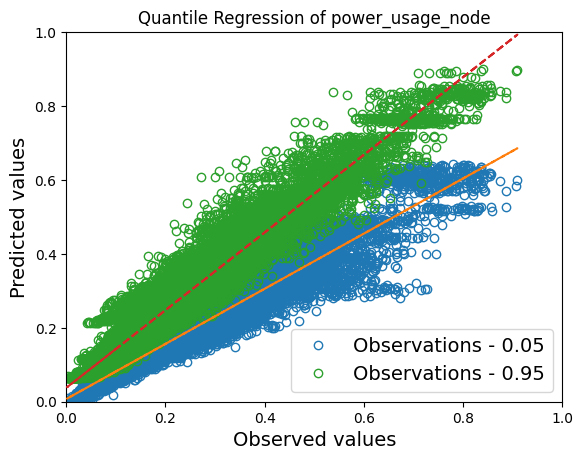

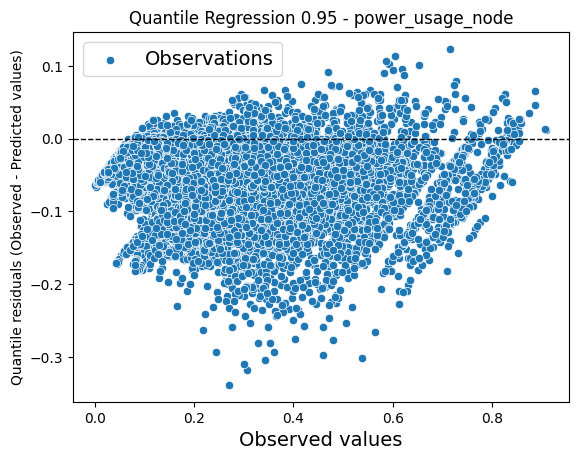

mape: 0.22888743349172785
mse: 63710928718.9554
rmse: 252410.23893446833
R-squared score: 0.8111926595241506
Standard deviation: 630556.9084160633
Quantile loss with library:  12485.30805198591
------------------------------
Target: overloaded_node
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.97      0.98     22605
           1       0.97      1.00      0.98     22765

    accuracy                           0.98     45370
   macro avg       0.98      0.98      0.98     45370
weighted avg       0.98      0.98      0.98     45370

Classification Report:
               precision    recall  f1-score   support

         0.0       1.00      0.97      0.98     22605
         1.0       0.97      1.00      0.98     22765

    accuracy                           0.98     45370
   macro avg       0.98      0.98      0.98     45370
weighted avg       0.98      0.98      0.98     45370

------------------------------
Target: cpu_usage_

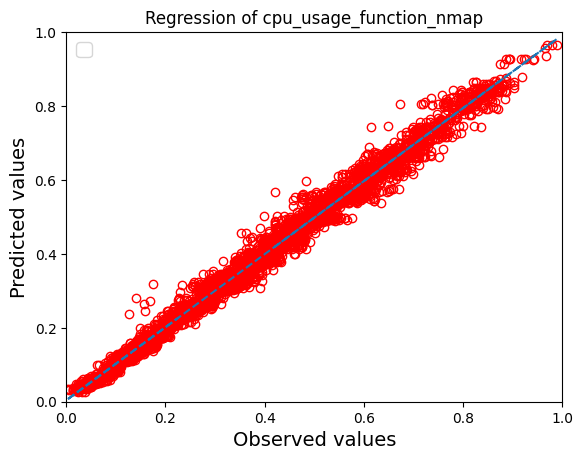

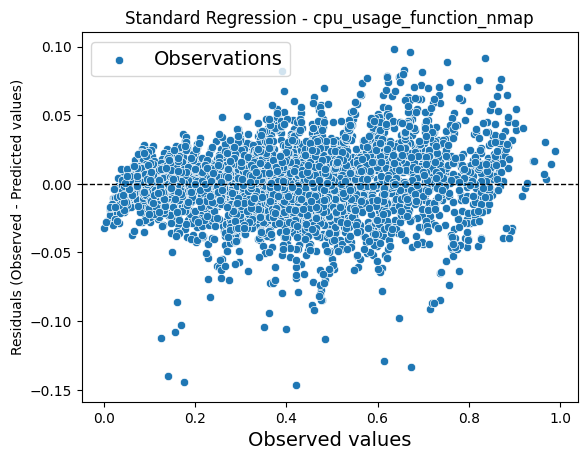

mape: 0.046646192412839835
mse: 57.04978092045508
rmse: 7.553130537760822
R-squared score: 0.9900703282848207
Standard deviation: 75.28565713034892
------------------------------
Target: cpu_usage_function_nmap quantiles
Prediction for alpha 0.05 are greater than true values in 4.873613384251682 % of cases and less or equal in 95.12638661574832 % of cases.
mape: 0.1211067535384801
mse: 0.002880265485845198
rmse: 0.05366810492131428
R-squared score: 0.9360756421473821
Standard deviation: 0.18728072406239357
Quantile loss with library:  0.0023582147543587625
Prediction for alpha 0.95 are greater than true values in 95.23549736315694 % of cases and less or equal in 4.764502636843063 % of cases.
mape: 0.23134154052057665
mse: 0.002198783450931359
rmse: 0.04689118734827855
R-squared score: 0.9512003942523706
Standard deviation: 0.2168253158832622
Quantile loss with library:  0.0021919137581109262


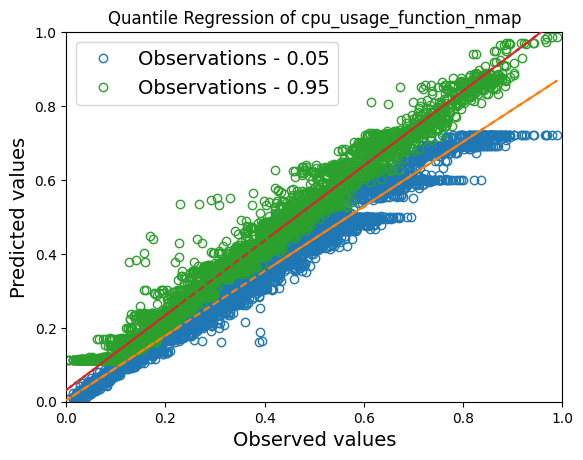

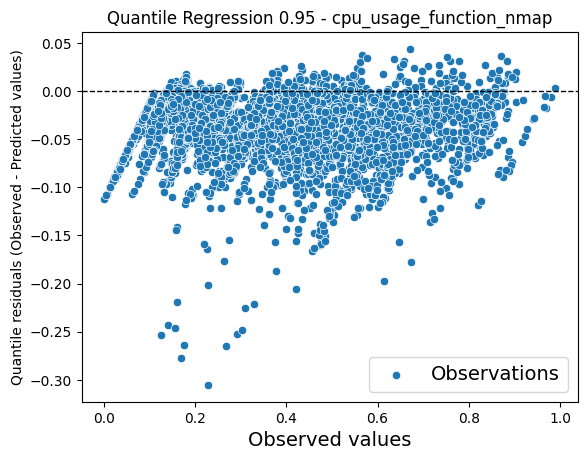

mape: 0.1483579651494583
mse: 280.3724933474873
rmse: 16.74432719900944
R-squared score: 0.9512003942523706
Standard deviation: 77.42593522343822
Quantile loss with library:  0.7827082919700726
------------------------------
Target: ram_usage_function_nmap
mape: 29500942581.689335
mse: 0.03504852509494062
rmse: 0.18721251319006596
R-squared score: 0.5383474529560351
Standard deviation: 0.1948763878762316


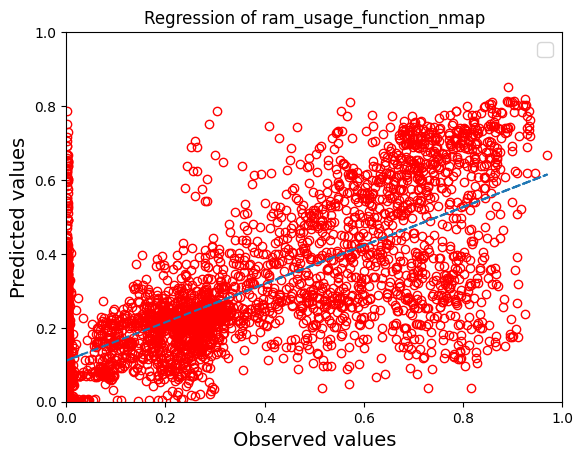

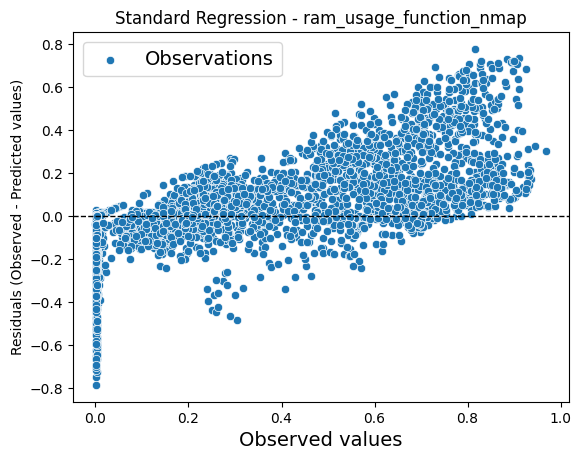

mape: 11.065542783425434
mse: 3922981772283514.5
rmse: 62633711.1488974
R-squared score: 0.538347452956035
Standard deviation: 65197732.67286097
------------------------------
Target: ram_usage_function_nmap quantiles
Prediction for alpha 0.05 are greater than true values in 6.492089470812876 % of cases and less or equal in 93.50791052918711 % of cases.
mape: 801005157.3057646
mse: 0.10580771752662974
rmse: 0.3252809824238573
R-squared score: -0.3936792535708764
Standard deviation: 0.08204207730501319
Quantile loss with library:  0.010523733727286308
Prediction for alpha 0.95 are greater than true values in 94.19894526277504 % of cases and less or equal in 5.80105473722495 % of cases.
mape: 343357526762.3458
mse: 0.16563847317013372
rmse: 0.406987067571113
R-squared score: -1.1817586566147402
Standard deviation: 0.269603239126177
Quantile loss with library:  0.016463390890267254


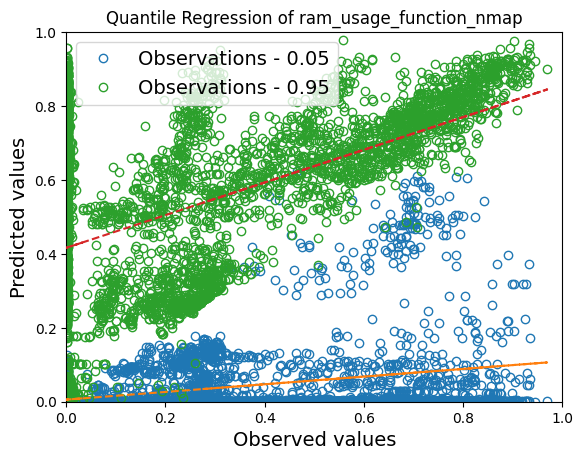

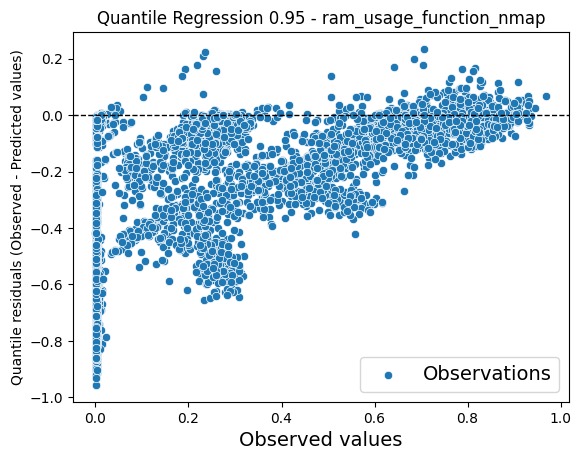

mape: 43.690149388573175
mse: 1.8539915995754896e+16
rmse: 136161360.14213026
R-squared score: -1.181758656614741
Standard deviation: 90198305.21206911
Quantile loss with library:  5507982.623498612
------------------------------
Target: power_usage_function_nmap
mape: 0.08961484736285681
mse: 0.0009300647151539221
rmse: 0.030496962392243625
R-squared score: 0.9765871882416308
Standard deviation: 0.19599035891863806


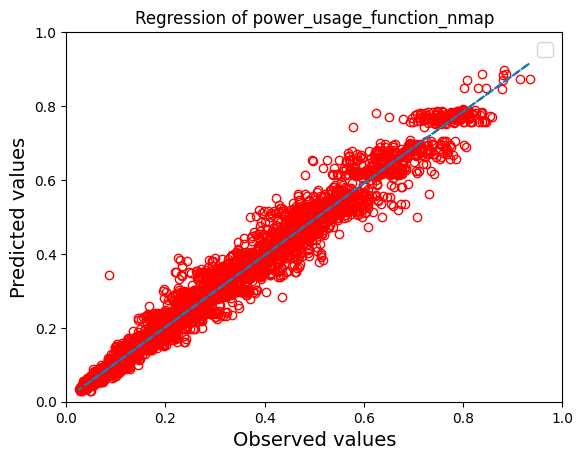

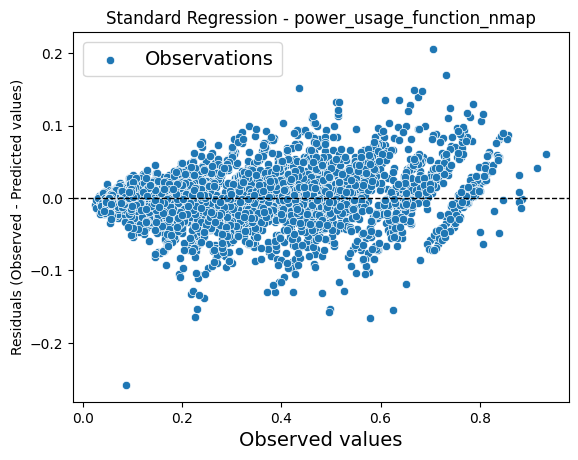

mape: 0.08899497740072228
mse: 2982529.7018534434
rmse: 1727.0002032001744
R-squared score: 0.9765871882416308
Standard deviation: 11098.659116419029
------------------------------
Target: power_usage_function_nmap quantiles
Prediction for alpha 0.05 are greater than true values in 6.382978723404255 % of cases and less or equal in 93.61702127659575 % of cases.
mape: 0.16966527261868983
mse: 0.003988747616007956
rmse: 0.06315653264712967
R-squared score: 0.8995900010358067
Standard deviation: 0.17055107836742872
Quantile loss with library:  0.0029212350237429663
Prediction for alpha 0.95 are greater than true values in 94.58083287870522 % of cases and less or equal in 5.419167121294781 % of cases.
mape: 0.2197444890180173
mse: 0.003627374836564841
rmse: 0.06022769160913309
R-squared score: 0.908686951733802
Standard deviation: 0.21551294951648903
Quantile loss with library:  0.002964497814520657


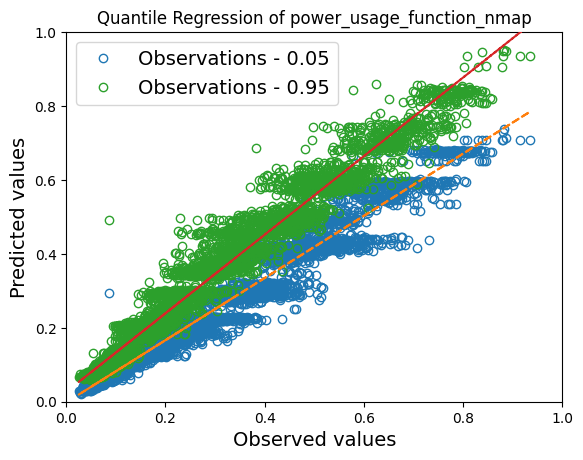

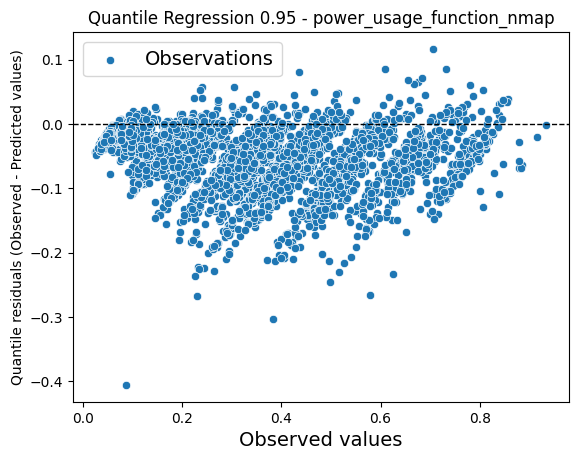

mape: 0.2180665645238196
mse: 11632258.501517236
rmse: 3410.6096964497765
R-squared score: 0.908686951733802
Standard deviation: 12204.19603828825
Quantile loss with library:  167.87535303403695
------------------------------
Target: medium_latency_function_nmap
mape: 1.2667086532312615
mse: 0.0007060016165897244
rmse: 0.026570690931733868
R-squared score: 0.9920177481751603
Standard deviation: 0.29339899162162564


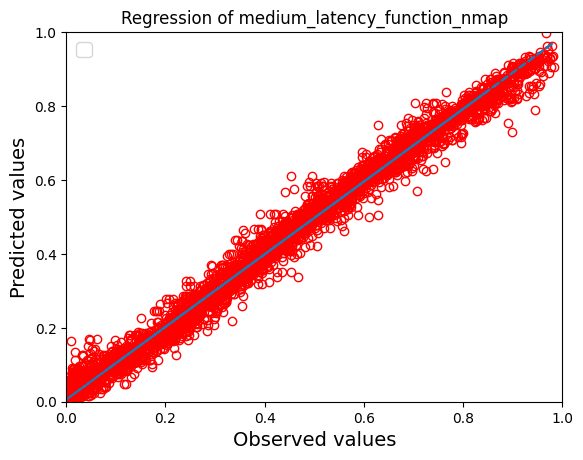

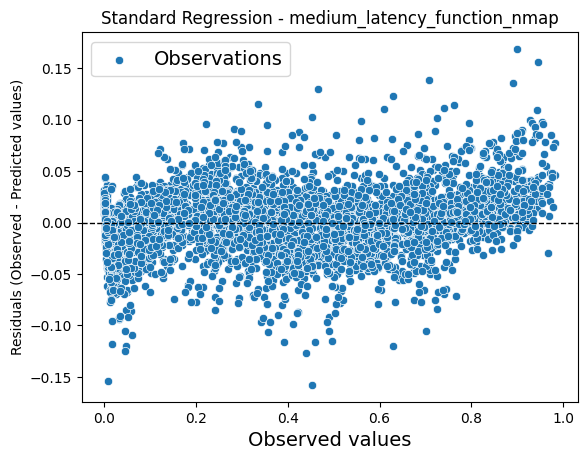

mape: 0.4395080936413598
mse: 6.128460351762168e+17
rmse: 782844834.6742903
R-squared score: 0.9920177481751603
Standard deviation: 8644332421.755615
------------------------------
Target: medium_latency_function_nmap quantiles
Prediction for alpha 0.05 are greater than true values in 5.3100563738861615 % of cases and less or equal in 94.68994362611383 % of cases.
mape: 0.5215285844444264
mse: 0.03421449461628595
rmse: 0.18497160489190212
R-squared score: 0.6131613502444317
Standard deviation: 0.20754942620345707
Quantile loss with library:  0.00572596782888191
Prediction for alpha 0.95 are greater than true values in 95.79923622476814 % of cases and less or equal in 4.20076377523186 % of cases.
mape: 5.6176286685762635
mse: 0.020695890151054386
rmse: 0.1438606622779639
R-squared score: 0.7660064749951725
Standard deviation: 0.3036769862132383
Quantile loss with library:  0.004815658753768617


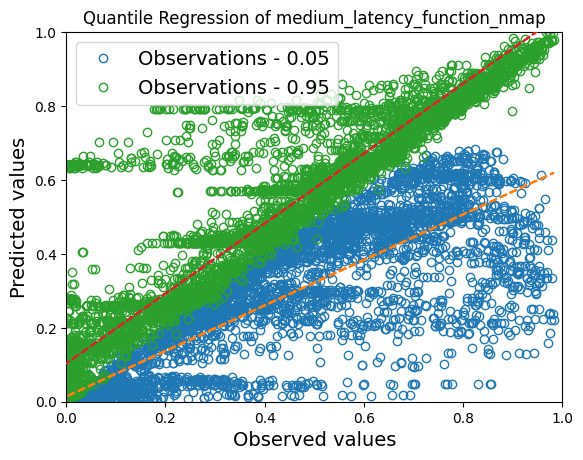

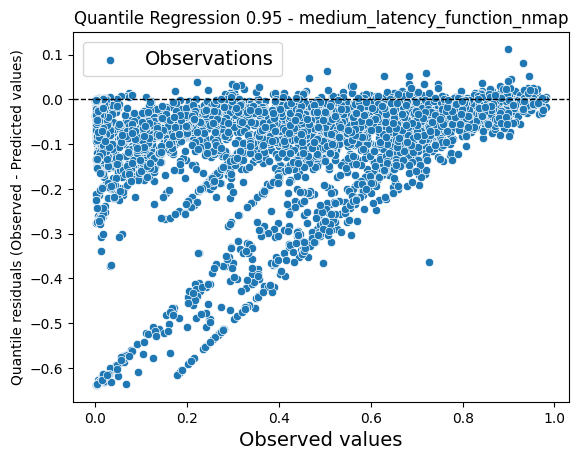

mape: 2.772572870635008
mse: 1.7965106489107149e+19
rmse: 4238526452.5666404
R-squared score: 0.7660064749951725
Standard deviation: 8947150101.488764
Quantile loss with library:  141882406.84548077
------------------------------
Target: cpu_usage_function_env
mape: 0.07932518820213381
mse: 0.00029279967608028735
rmse: 0.017111390243936563
R-squared score: 0.988566238493365
Standard deviation: 0.15871289742105513


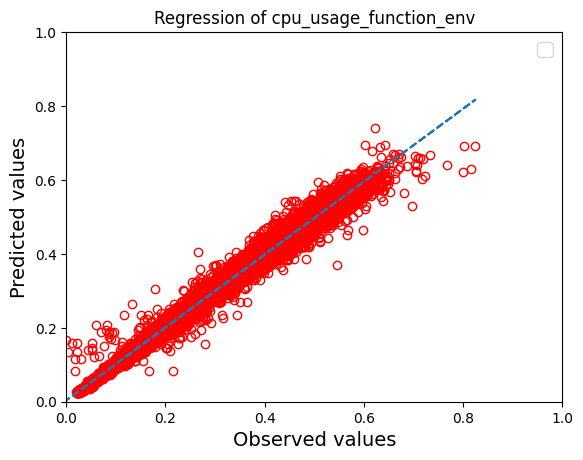

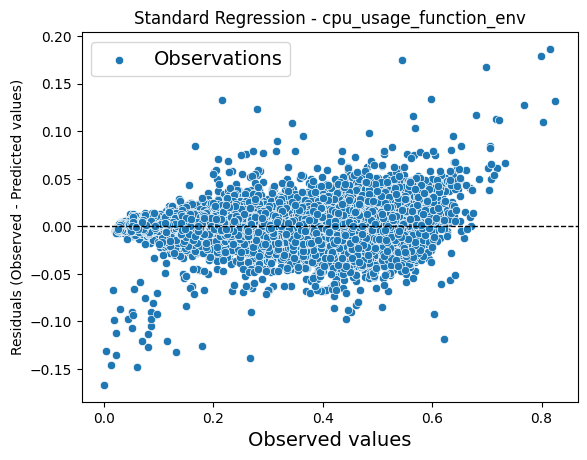

mape: 0.05724033952304902
mse: 0.3090032675433071
rmse: 0.5558806234645233
R-squared score: 0.988566238493365
Standard deviation: 5.1559471856203976
------------------------------
Target: cpu_usage_function_env quantiles
Prediction for alpha 0.05 are greater than true values in 4.687286163952374 % of cases and less or equal in 95.31271383604762 % of cases.
mape: 0.11791026085724682
mse: 0.002260543373407717
rmse: 0.04754517192531453
R-squared score: 0.9117262896156322
Standard deviation: 0.1365776707469065
Quantile loss with library:  0.001836899078998994
Prediction for alpha 0.95 are greater than true values in 94.90899137813057 % of cases and less or equal in 5.09100862186944 % of cases.
mape: 0.22209295856294764
mse: 0.0012164825823960967
rmse: 0.03487811036160211
R-squared score: 0.9524966287179959
Standard deviation: 0.16722922726710257
Quantile loss with library:  0.0016729794026593009


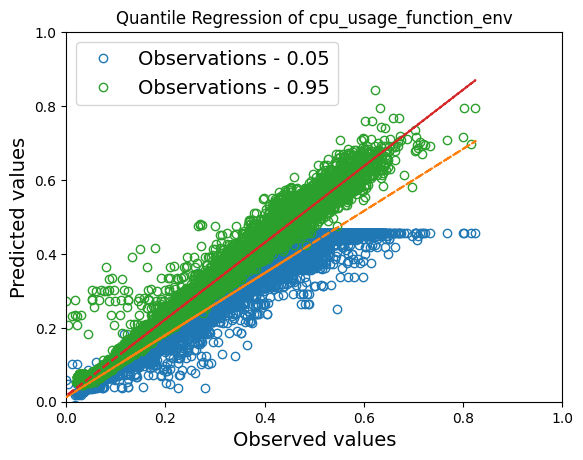

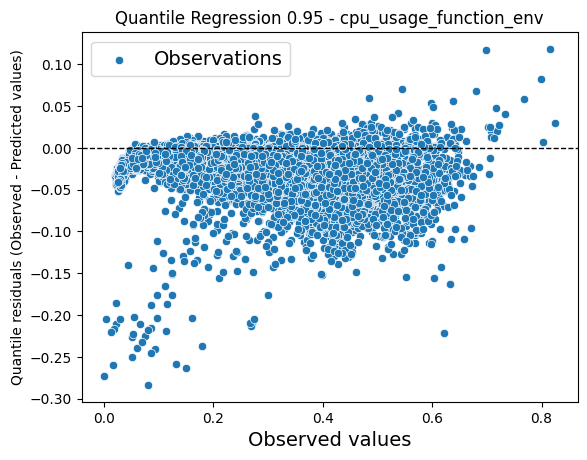

mape: 0.18359999835703536
mse: 1.2838029669364832
rmse: 1.1330502932070063
R-squared score: 0.9524966287179959
Standard deviation: 5.432608676999095
Quantile loss with library:  0.054348408874790054
------------------------------
Target: ram_usage_function_env
mape: 8.045928082342883
mse: 0.006323714073298106
rmse: 0.07952178364007001
R-squared score: 0.8072867614515551
Standard deviation: 0.15825772713659836


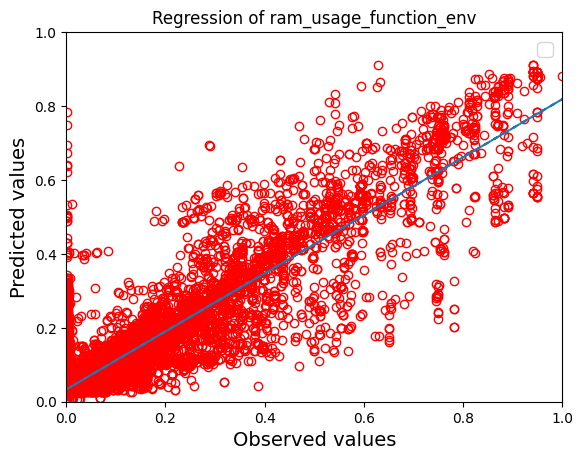

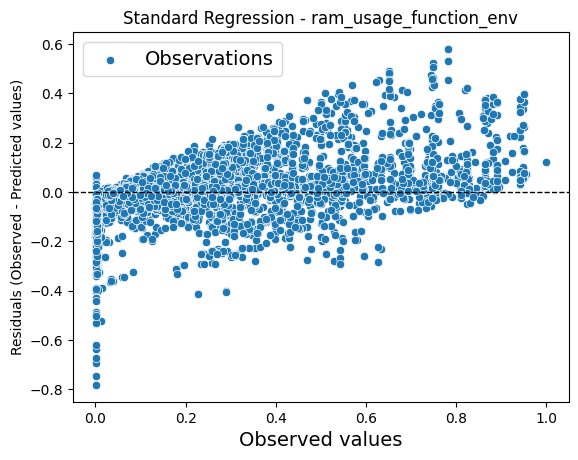

mape: 1.9242476606661814
mse: 257383770285861.88
rmse: 16043184.543159187
R-squared score: 0.8072867614515551
Standard deviation: 31927829.150879737
------------------------------
Target: ram_usage_function_env quantiles
Prediction for alpha 0.05 are greater than true values in 5.412618037498289 % of cases and less or equal in 94.58738196250171 % of cases.
mape: 0.9089848621017618
mse: 0.02996807892132777
rmse: 0.17311290801476292
R-squared score: 0.08673202566345495
Standard deviation: 0.07583337528107394
Quantile loss with library:  0.005540333649174629
Prediction for alpha 0.95 are greater than true values in 95.83960585739702 % of cases and less or equal in 4.160394142602984 % of cases.
mape: 24.479164516415455
mse: 0.028701050064115448
rmse: 0.1694138425988722
R-squared score: 0.12534433981578896
Standard deviation: 0.20768214574931682
Quantile loss with library:  0.006198619335116675


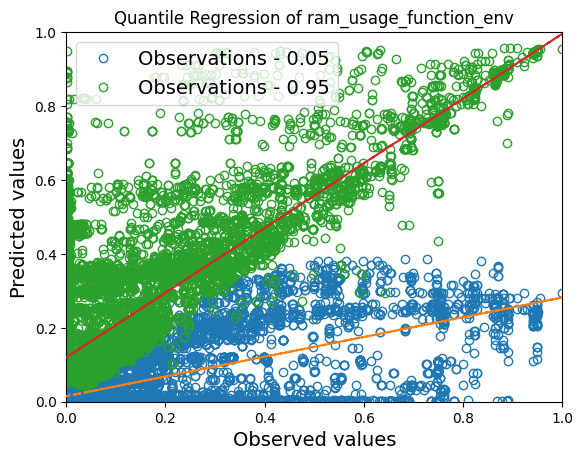

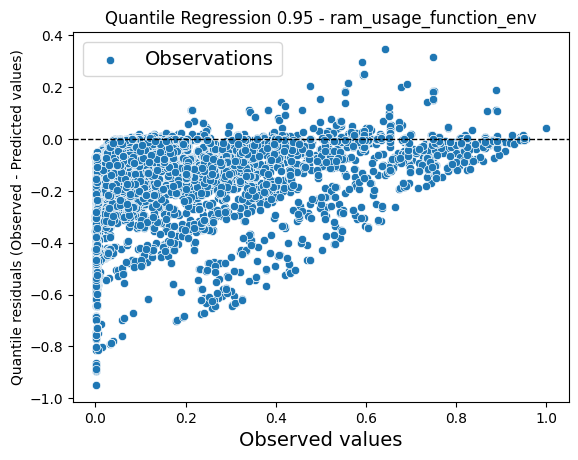

mape: 5.7280727428551215
mse: 1168171803949471.8
rmse: 34178528.40526449
R-squared score: 0.12534433981578885
Standard deviation: 41898997.206303604
Quantile loss with library:  1250545.3141768086
------------------------------
Target: power_usage_function_env
mape: 0.12364583014966365
mse: 0.001123862361355879
rmse: 0.03352405645735431
R-squared score: 0.9537003522574777
Standard deviation: 0.15122011134023988


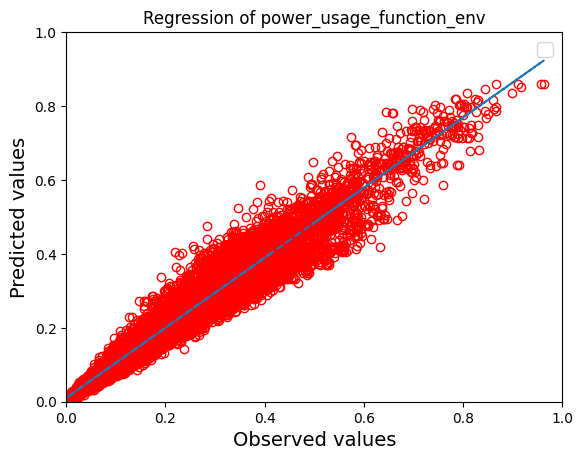

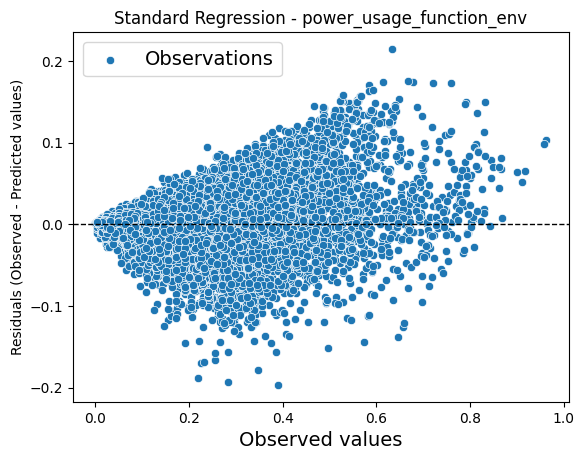

mape: 0.11395583063186807
mse: 8550272.31483916
rmse: 2924.0848679269143
R-squared score: 0.9537003522574777
Standard deviation: 13189.944357083186
------------------------------
Target: power_usage_function_env quantiles
Prediction for alpha 0.05 are greater than true values in 5.241549199397838 % of cases and less or equal in 94.75845080060216 % of cases.
mape: 0.22322493372518928
mse: 0.005677391129745113
rmse: 0.07534846468074258
R-squared score: 0.7661090731016282
Standard deviation: 0.11103175569555607
Quantile loss with library:  0.002916639969547157
Prediction for alpha 0.95 are greater than true values in 94.66265225126591 % of cases and less or equal in 5.337347748734091 % of cases.
mape: 0.35504224567295695
mse: 0.004731318759493532
rmse: 0.06878458228043209
R-squared score: 0.8050843239755302
Standard deviation: 0.17872011544653757
Quantile loss with library:  0.003207356725730214


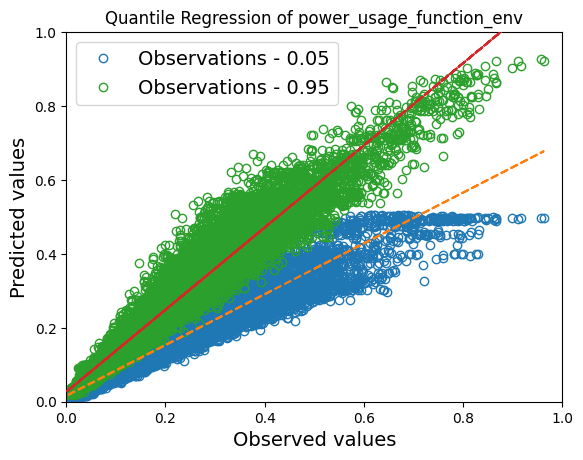

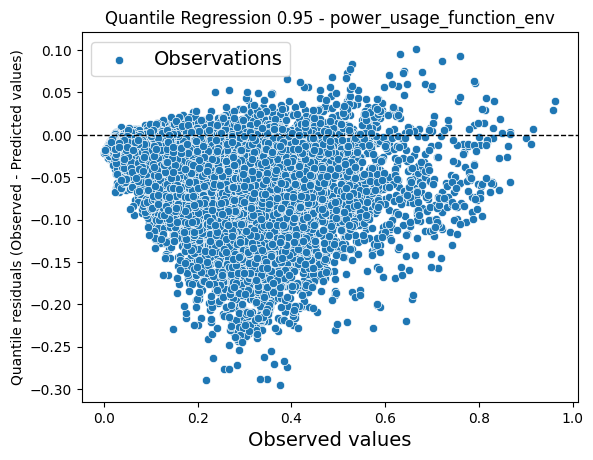

mape: 0.3132679660856083
mse: 35995567.778576605
rmse: 5999.630636845622
R-squared score: 0.8050843239755303
Standard deviation: 15588.590415248762
Quantile loss with library:  279.7568152195948
------------------------------
Target: medium_latency_function_env
mape: 1.8739166999016763
mse: 0.0001915869886002015
rmse: 0.013841495172133735
R-squared score: 0.870453788625847
Standard deviation: 0.03532971201812628


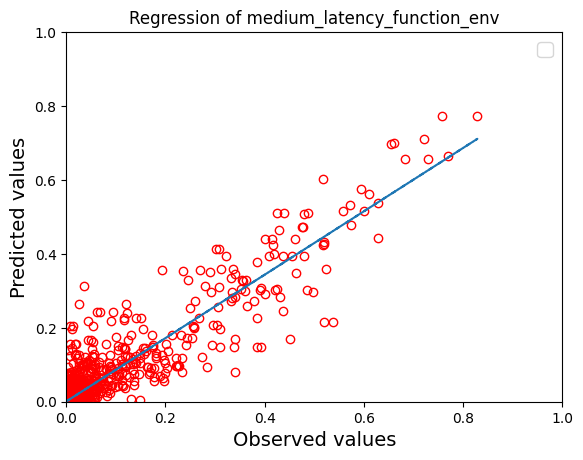

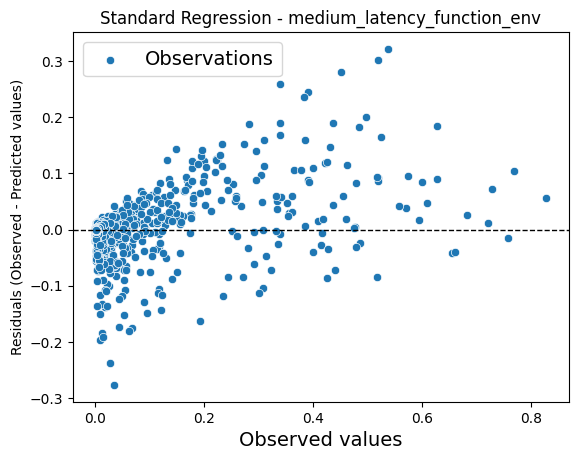

mape: 0.9733110020641497
mse: 1.2748416289610854e+17
rmse: 357049244.35728544
R-squared score: 0.870453788625847
Standard deviation: 911350025.5975536
------------------------------
Target: medium_latency_function_env quantiles
Prediction for alpha 0.05 are greater than true values in 5.275762967017928 % of cases and less or equal in 94.72423703298207 % of cases.
mape: 0.40267095059318336
mse: 0.0014939208735478965
rmse: 0.038651272599332306
R-squared score: -0.010151005947235614
Standard deviation: 0.0003028840397099188
Quantile loss with library:  0.00026367935298118053
Prediction for alpha 0.95 are greater than true values in 95.1484877514712 % of cases and less or equal in 4.851512248528808 % of cases.
mape: 3.486163391489173
mse: 0.0007410885401089612
rmse: 0.027222941430142356
R-squared score: 0.49889492305628846
Standard deviation: 0.052523073857539314
Quantile loss with library:  0.0004923441391444706


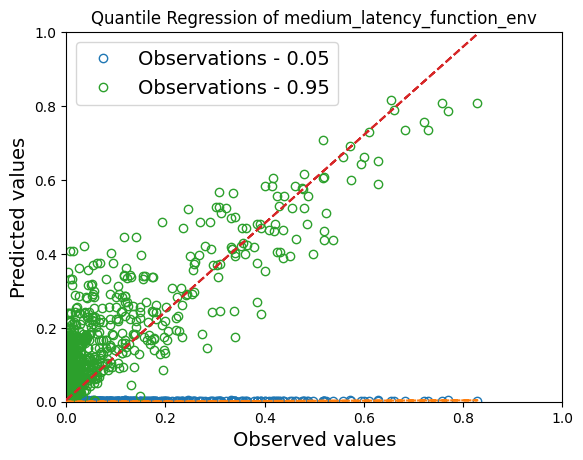

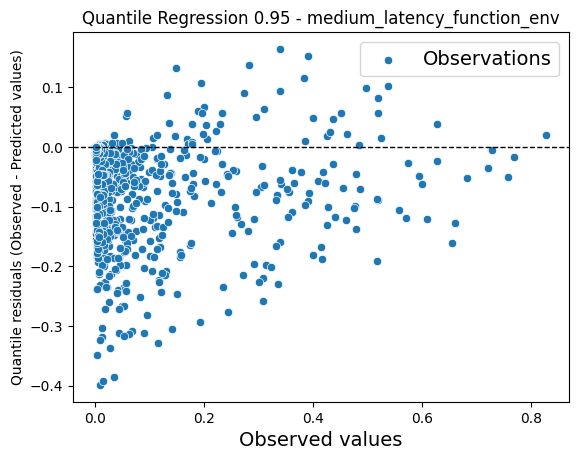

mape: 2.131653601466714
mse: 4.931287498069204e+17
rmse: 702231265.1875594
R-squared score: 0.49889492305628835
Standard deviation: 1354862577.9902205
Quantile loss with library:  12700297.233725248
------------------------------
Target: cpu_usage_function_figlet
mape: 235133106.707013
mse: 0.0003274150144598737
rmse: 0.01809461285741902
R-squared score: 0.9915544860829906
Standard deviation: 0.19584816146944004


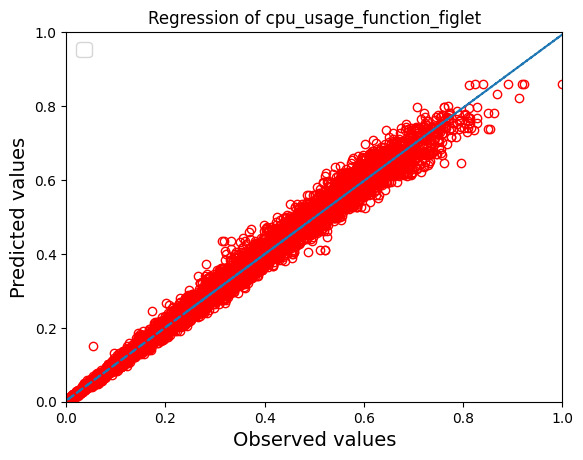

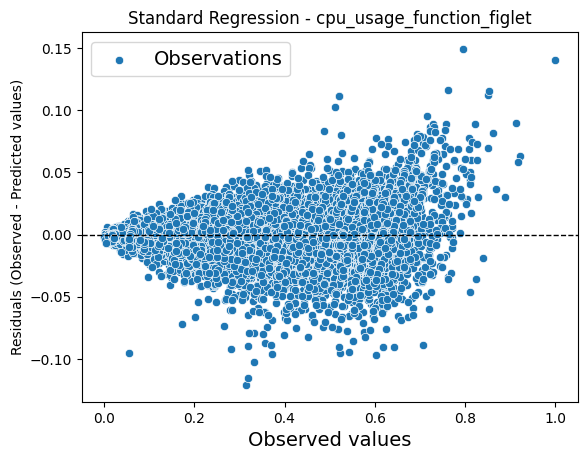

mape: 0.0388734248126202
mse: 0.4838497711526786
rmse: 0.6955931074649019
R-squared score: 0.9915544860829906
Standard deviation: 7.528795023208214
------------------------------
Target: cpu_usage_function_figlet quantiles
Prediction for alpha 0.05 are greater than true values in 4.663455105044828 % of cases and less or equal in 95.33654489495518 % of cases.
mape: 184125330.50747722
mse: 0.002553064519549399
rmse: 0.05052785884588223
R-squared score: 0.9341449201208823
Standard deviation: 0.17105570963027147
Quantile loss with library:  0.0020187682784226627
Prediction for alpha 0.95 are greater than true values in 95.14251304696909 % of cases and less or equal in 4.857486953030912 % of cases.
mape: 20208595205.053886
mse: 0.0015455210526335483
rmse: 0.039313115529471185
R-squared score: 0.9601340226239156
Standard deviation: 0.20099923550986418
Quantile loss with library:  0.001956504026655027


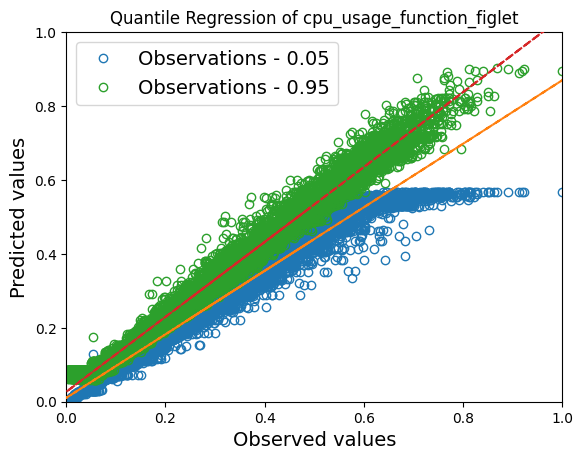

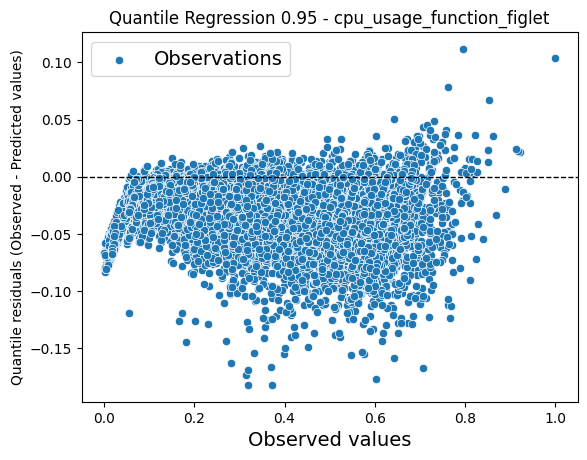

mape: 0.18865216268747154
mse: 2.2839514823778373
rmse: 1.5112747871839314
R-squared score: 0.9601340226239156
Standard deviation: 7.726812611470198
Quantile loss with library:  0.07521192779267256
------------------------------
Target: ram_usage_function_figlet
mape: 3.4802333718236924
mse: 0.001618842099667182
rmse: 0.040234836891271004
R-squared score: 0.7707491221922504
Standard deviation: 0.07257787976331143


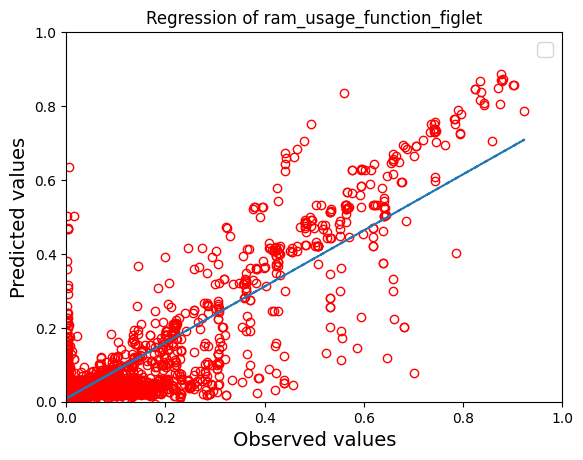

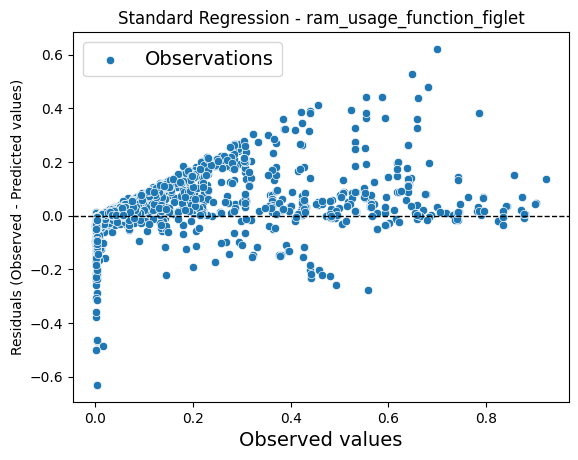

mape: 1.3653975954927469
mse: 76682981267911.81
rmse: 8756881.937534148
R-squared score: 0.7707491221922504
Standard deviation: 15796160.08091117
------------------------------
Target: ram_usage_function_figlet quantiles
Prediction for alpha 0.05 are greater than true values in 5.479727017262144 % of cases and less or equal in 94.52027298273785 % of cases.
mape: 0.48662572114526076
mse: 0.005900112967641409
rmse: 0.0768121928318767
R-squared score: 0.16446077274938564
Standard deviation: 0.02386398956065999
Quantile loss with library:  0.0015101532998838003
Prediction for alpha 0.95 are greater than true values in 95.2562558544092 % of cases and less or equal in 4.743744145590793 % of cases.
mape: 14.812009736248298
mse: 0.007247507613352774
rmse: 0.08513229477321033
R-squared score: -0.026349316354608687
Standard deviation: 0.09879914418056789
Quantile loss with library:  0.0035296972458204886


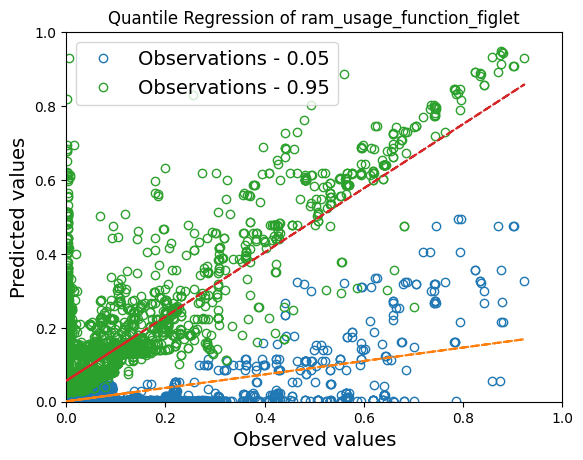

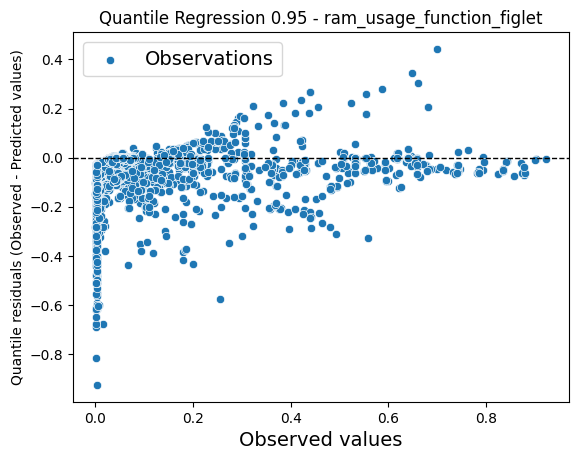

mape: 5.692274396834432
mse: 343307411308390.06
rmse: 18528556.643958807
R-squared score: -0.026349316354608465
Standard deviation: 21503068.185827475
Quantile loss with library:  768218.4008951518
------------------------------
Target: power_usage_function_figlet
mape: 50376572186.61919
mse: 0.0013244876202804369
rmse: 0.03639351068913848
R-squared score: 0.953203270680661
Standard deviation: 0.16308870807771553


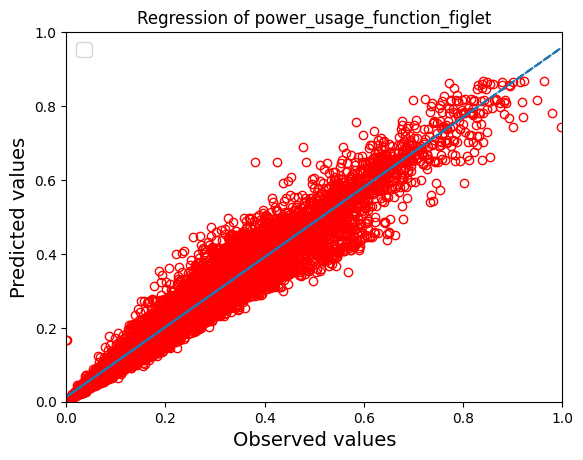

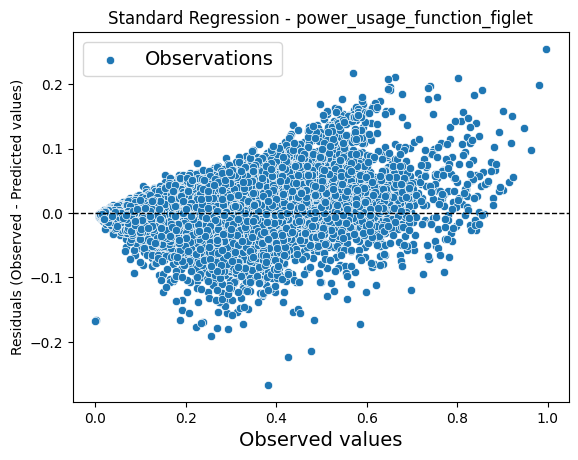

mape: 0.1433603539330326
mse: 8880983.324678916
rmse: 2980.097871661083
R-squared score: 0.953203270680661
Standard deviation: 13354.587195112419
------------------------------
Target: power_usage_function_figlet quantiles
Prediction for alpha 0.05 are greater than true values in 4.824033186136759 % of cases and less or equal in 95.17596681386324 % of cases.
mape: 37358641653.49586
mse: 0.005710098708860914
rmse: 0.07556519508914745
R-squared score: 0.7982510824761856
Standard deviation: 0.12909833188297476
Quantile loss with library:  0.0031719097501470704
Prediction for alpha 0.95 are greater than true values in 94.73437709086043 % of cases and less or equal in 5.2656229091395685 % of cases.
mape: 56840689559.75094
mse: 0.005752175607390077
rmse: 0.07584309861411305
R-squared score: 0.7967644236347464
Standard deviation: 0.1917808666643552
Quantile loss with library:  0.003514123748175195


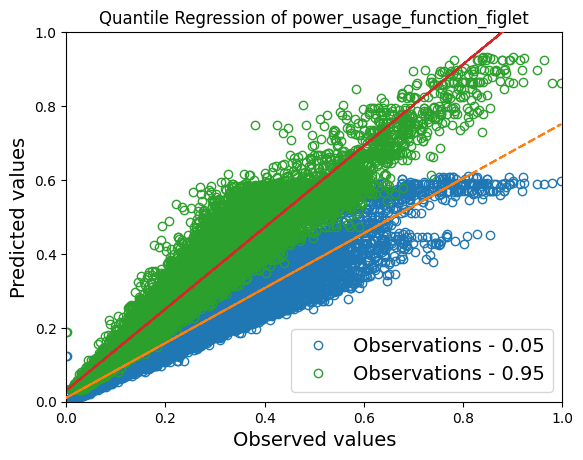

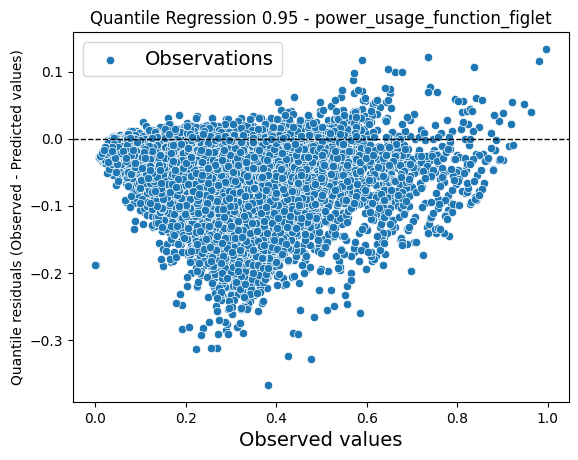

mape: 0.3380777281594233
mse: 38569613.53782963
rmse: 6210.443908274966
R-squared score: 0.7967644236347465
Standard deviation: 15704.056622993856
Quantile loss with library:  287.7554955371763
------------------------------
Target: medium_latency_function_figlet
mape: 1.4150378345928987
mse: 9.669202360495018e-05
rmse: 0.009833210239029276
R-squared score: 0.9183027318871075
Standard deviation: 0.03373079936624215


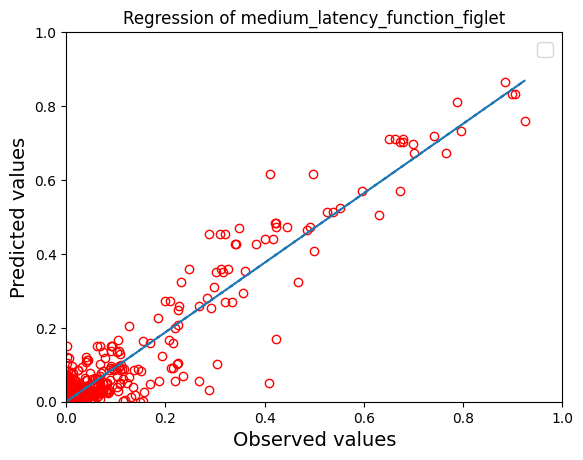

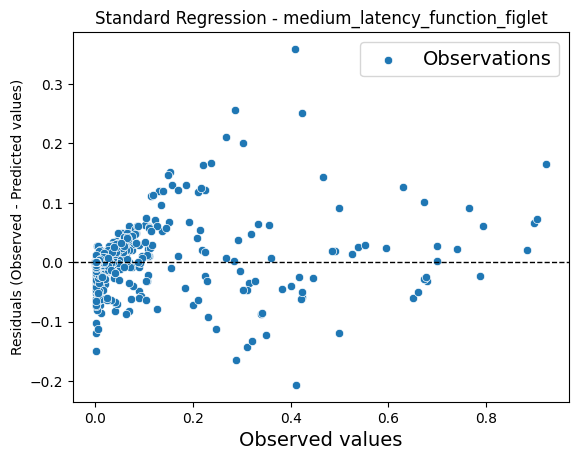

mape: 0.7718034163180103
mse: 5.877075706156098e+16
rmse: 242426807.63801882
R-squared score: 0.9183027318871075
Standard deviation: 831595156.6844401
------------------------------
Target: medium_latency_function_figlet quantiles
Prediction for alpha 0.05 are greater than true values in 5.553325304429279 % of cases and less or equal in 94.44667469557072 % of cases.
mape: 0.36574523602384784
mse: 0.0011905023668809412
rmse: 0.03450365729717563
R-squared score: -0.005882258225134995
Standard deviation: 0.00021545052571106271
Quantile loss with library:  0.00018171377875226443
Prediction for alpha 0.95 are greater than true values in 94.9685534591195 % of cases and less or equal in 5.031446540880504 % of cases.
mape: 3.750178473357523
mse: 0.00026931864039746975
rmse: 0.01641093051589305
R-squared score: 0.7724466160492546
Standard deviation: 0.04174327990942132
Quantile loss with library:  0.00033485512272781126


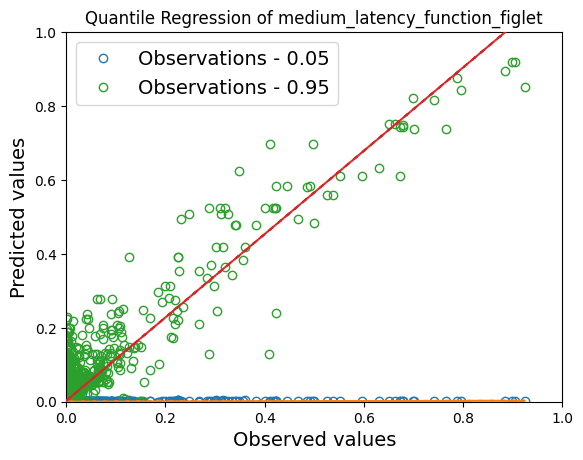

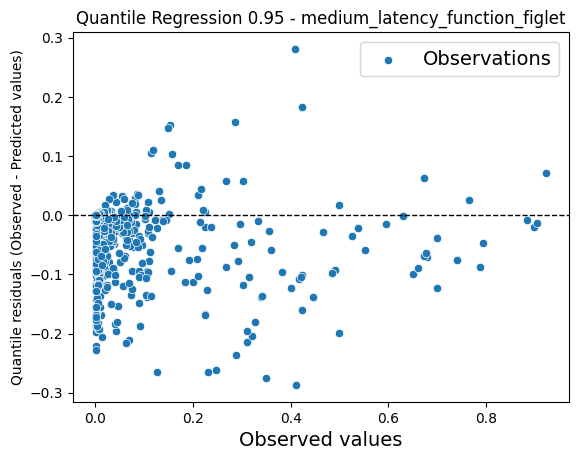

mape: 2.080870101447085
mse: 1.6369561621357226e+17
rmse: 404593148.99485415
R-squared score: 0.7724466160492546
Standard deviation: 1029133908.7427324
Quantile loss with library:  8255478.775581846
------------------------------


In [300]:
all_metrics, all_metrics_no_scale = compute_metrics_and_plot(all_predictions, y_test_dict, y_scalers)

In [301]:
os.makedirs("output/metrics/functions", exist_ok = True)
all_metrics.to_csv("output/metrics/functions/all_metrics.csv")
all_metrics

,mape,mse,rmse,r2,quantile_loss,std_dev
cpu_usage_function_curl,0.505849,0.000526,0.022926,0.985997,Not calculated for this target,0.191779
cpu_usage_function_curl quantiles,1.134778,0.002378,0.048763,0.936653,0.002234,0.20306
cpu_usage_function_eat-memory,28595882665.96661,0.00027,0.016417,0.990125,Not calculated for this target,0.163886
cpu_usage_function_eat-memory quantiles,117088367536.232864,0.001178,0.034317,0.956852,0.001503,0.175588
cpu_usage_function_env,0.079325,0.000293,0.017111,0.988566,Not calculated for this target,0.158713
cpu_usage_function_env quantiles,0.222093,0.001216,0.034878,0.952497,0.001673,0.167229
cpu_usage_function_figlet,235133106.707013,0.000327,0.018095,0.991554,Not calculated for this target,0.195848
cpu_usage_function_figlet quantiles,20208595205.053886,0.001546,0.039313,0.960134,0.001957,0.200999
cpu_usage_function_nmap,0.065741,0.000447,0.021152,0.99007,Not calculated for this target,0.210832
cpu_usage_function_nmap quantiles,0.231342,0.002199,0.046891,0.9512,0.002192,0.216825


In [302]:
all_metrics_no_scale.to_csv("output/metrics/functions/all_metrics_no_scale.csv")
all_metrics_no_scale

,mape,mse,rmse,r2,quantile_loss,std_dev
cpu_usage_function_curl,0.124321,8.788171,2.964485,0.985997,Not calculated for this target,24.79781
cpu_usage_function_curl quantiles,0.35101,39.755545,6.3052,0.936653,0.288887,26.256494
cpu_usage_function_eat-memory,0.0496,25.286907,5.028609,0.990125,Not calculated for this target,50.198431
cpu_usage_function_eat-memory quantiles,0.13933,110.484556,10.511163,0.956852,0.460483,53.782647
cpu_usage_function_env,0.05724,0.309003,0.555881,0.988566,Not calculated for this target,5.155947
cpu_usage_function_env quantiles,0.1836,1.283803,1.13305,0.952497,0.054348,5.432609
cpu_usage_function_figlet,0.038873,0.48385,0.695593,0.991554,Not calculated for this target,7.528795
cpu_usage_function_figlet quantiles,0.188652,2.283951,1.511275,0.960134,0.075212,7.726813
cpu_usage_function_nmap,0.046646,57.049781,7.553131,0.99007,Not calculated for this target,75.285657
cpu_usage_function_nmap quantiles,0.148358,280.372493,16.744327,0.9512,0.782708,77.425935


### Run multiple training experiments to average results

In [313]:
rng = np.random.default_rng(seed = SEED)
all_metrics = pd.DataFrame()
all_metrics_no_scale = pd.DataFrame()
for exp in range(NUM_TRAINING_EXPERIMENTS):
    print(80*"#", f" {exp} ", 80*"#")
    # experiment folder
    exp_folder = f"output/metrics/functions/exp_{exp}"
    os.makedirs(exp_folder, exist_ok = True)
    # set seed
    seed = int(rng.integers(0, SEED**2))
    np.random.seed(seed)
    with open(os.path.join(exp_folder, "seed.txt"), "w") as ostream:
        ostream.write(str(seed))
    # train/test split
    x_train_dict, x_test_dict, y_train_dict, y_test_dict, y_scalers = build_train_test_data(targets, target_datasets, features_datasets)
    # train models
    trained_models = train_all_models(targets, x_train_dict, y_train_dict)
    # evaluate models
    all_predictions = evaluate_all_models(trained_models, targets, params, x_test_dict, y_test_dict)
    # compute metrics
    exp_metrics, exp_metrics_no_scale = compute_metrics_and_plot(all_predictions, y_test_dict, y_scalers, plot_folder = exp_folder)
    exp_metrics.to_csv(os.path.join(exp_folder, "all_metrics.csv"), index = False)
    exp_metrics_no_scale.to_csv(os.path.join(exp_folder, "all_metrics_no_scale.csv"), index = False)
    # merge
    exp_metrics["exp"] = [exp] * len(exp_metrics)
    exp_metrics_no_scale["exp"] = [exp] * len(exp_metrics_no_scale)
    all_metrics = pd.concat([all_metrics, exp_metrics], ignore_index = True)
    all_metrics_no_scale = pd.concat([all_metrics_no_scale, exp_metrics_no_scale], ignore_index = True)

################################################################################  0  ################################################################################
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 103
[LightGBM] [Info] Number of data points in the train set: 54008, number of used features: 7
[LightGBM] [Info] Start training from score 0.278805
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 103
[LightGBM] [Info] Number of data points in the train set: 54008, number of used features: 7
[LightGBM] [Info] Start training from score 0.037536
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.00

In [322]:
for col in all_metrics:
  if col != "metric" and col != "quantile_loss":
    all_metrics[col] = all_metrics[col].astype(float)
all_metrics.to_csv("output/metrics/functions/all_metrics.csv", index = False)
#
for col in all_metrics_no_scale:
  if col != "metric" and col != "quantile_loss":
    all_metrics_no_scale[col] = all_metrics_no_scale[col].astype(float)
all_metrics_no_scale.to_csv("output/metrics/functions/all_metrics_no_scale.csv", index = False)

In [ ]:
# standard metrics
all_metrics[~all_metrics["metric"].str.contains("quantiles")].groupby("metric").mean(numeric_only = True)

,mape,mse,rmse,r2,std_dev,exp
metric,,,,,,
cpu_usage_function_curl,1.648937e-01,0.000514,0.022681,0.986267,0.191949,2.0
cpu_usage_function_eat-memory,5.557417e+09,0.000284,0.016855,0.989172,0.160776,2.0
cpu_usage_function_env,2.281423e+10,0.000307,0.017513,0.988161,0.159745,2.0
cpu_usage_function_figlet,4.928900e-02,0.000330,0.018161,0.991638,0.197339,2.0
cpu_usage_function_nmap,1.535428e+10,0.000463,0.021527,0.989684,0.210629,2.0
cpu_usage_function_shasum,8.820391e+09,0.000292,0.017079,0.988773,0.160158,2.0
cpu_usage_node,6.641658e+08,0.000571,0.023894,0.983490,0.183886,2.0
medium_latency_function_curl,2.475802e+08,0.000706,0.026572,0.986773,0.226992,2.0
medium_latency_function_eat-memory,5.461016e+09,0.001331,0.036475,0.962286,0.178758,2.0


In [324]:
# quantile metrics
quantile_metrics = all_metrics[all_metrics["metric"].str.contains("quantiles")]
quantile_metrics["quantile_loss"] = quantile_metrics["quantile_loss"].astype(float)
quantile_metrics.groupby("metric").mean(numeric_only = True)

,mape,mse,rmse,r2,quantile_loss,std_dev,exp
metric,,,,,,,
cpu_usage_function_curl quantiles,4.419796e-01,0.002373,0.048712,0.936654,0.002221,0.203709,2.0
cpu_usage_function_eat-memory quantiles,1.876336e+10,0.001169,0.034186,0.955451,0.001566,0.172115,2.0
cpu_usage_function_env quantiles,4.059341e+10,0.001232,0.035104,0.952435,0.001649,0.168318,2.0
cpu_usage_function_figlet quantiles,3.730187e-01,0.001542,0.039257,0.960919,0.001956,0.202962,2.0
cpu_usage_function_nmap quantiles,5.700996e+10,0.002334,0.048307,0.948049,0.002205,0.217058,2.0
cpu_usage_function_shasum quantiles,1.793363e+10,0.001129,0.033597,0.956561,0.001559,0.168651,2.0
cpu_usage_node quantiles,4.976843e+09,0.003305,0.057488,0.904417,0.002854,0.193570,2.0
medium_latency_function_curl quantiles,1.320126e+09,0.013678,0.116933,0.743942,0.004166,0.248889,2.0
medium_latency_function_eat-memory quantiles,6.308280e+10,0.016256,0.127347,0.538589,0.005710,0.176874,2.0


In [325]:
# standard metrics
all_metrics_no_scale[~all_metrics_no_scale["metric"].str.contains("quantiles")].groupby("metric").mean(numeric_only = True)

,mape,mse,rmse,r2,std_dev,exp
metric,,,,,,
cpu_usage_function_curl,0.076756,8.601602e+00,2.932679e+00,0.986267,2.481973e+01,2.0
cpu_usage_function_eat-memory,0.050003,2.668271e+01,5.162788e+00,0.989172,4.924572e+01,2.0
cpu_usage_function_env,0.057276,3.237072e-01,5.689223e-01,0.988161,5.189486e+00,2.0
cpu_usage_function_figlet,0.038769,4.874580e-01,6.981557e-01,0.991638,7.586087e+00,2.0
cpu_usage_function_nmap,0.046708,5.909644e+01,7.687016e+00,0.989684,7.521322e+01,2.0
cpu_usage_function_shasum,0.052945,3.032280e-01,5.506243e-01,0.988773,5.163322e+00,2.0
cpu_usage_node,0.035875,9.731352e+01,9.864440e+00,0.983490,7.591578e+01,2.0
medium_latency_function_curl,0.295175,5.518497e+17,7.428346e+08,0.986773,6.345581e+09,2.0
medium_latency_function_eat-memory,0.212836,9.187664e+17,9.583753e+08,0.962286,4.696790e+09,2.0


In [ ]:
# quantile metrics
quantile_metrics_no_scale = all_metrics_no_scale[all_metrics_no_scale["metric"].str.contains("quantiles")]
quantile_metrics_no_scale["quantile_loss"] = quantile_metrics_no_scale["quantile_loss"].astype(float)
quantile_metrics_no_scale.groupby("metric").mean(numeric_only = True)